### Deep GCN Code



In [ ]:
pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.5 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/huawei-noah/Efficient-AI-Backbones.git

Cloning into 'Efficient-AI-Backbones'...
remote: Enumerating objects: 1023, done.
remote: Counting objects: 100% (117/117), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 1023 (delta 95), reused 88 (delta 77), pack-reused 906
Receiving objects: 100% (1023/1023), 99.96 MiB | 29.21 MiB/s, done.
Resolving deltas: 100% (401/401), done.


In [ ]:
cd '/content/Efficient-AI-Backbones/vig_pytorch'

/content/Efficient-AI-Backbones/vig_pytorch


In [ ]:
ls

 data/      License.txt       readme.md                                      train.py
 gcn_lib/   pyramid_vig.py*  'THIRD PARTY OPEN SOURCE SOFTWARE NOTICE.txt'   vig.py


In [ ]:
!pip install torchprofile

In [ ]:
!pip install apex

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 kB 2.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.8/709.8 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.3/247.3 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.4/145.4 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.0/115.0 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.1/247.1 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 kB 11.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.0/41.0 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Vision Transformer to generate patches in the images

In [ ]:
pip install torch

###torch_nn.py

this code provides a set of reusable components for building neural networks, especially in the context of computer vision tasks where convolutional layers, activation functions, and normalization layers are commonly used. The batched_index_select function is particularly relevant for graph-based neural network architectures.

In [ ]:
import torch
from torch import nn
from torch.nn import Sequential as Seq, Linear as Lin, Conv2d


##############################
#    Basic layers
##############################
def act_layer(act, inplace=False, neg_slope=0.2, n_prelu=1):
    # activation layer

    act = act.lower()
    if act == 'relu':
        layer = nn.ReLU(inplace)
    elif act == 'leakyrelu':
        layer = nn.LeakyReLU(neg_slope, inplace)
    elif act == 'prelu':
        layer = nn.PReLU(num_parameters=n_prelu, init=neg_slope)
    elif act == 'gelu':
        layer = nn.GELU()
    elif act == 'hswish':
        layer = nn.Hardswish(inplace)
    else:
        raise NotImplementedError('activation layer [%s] is not found' % act)
    return layer


def norm_layer(norm, nc):
    # normalization layer 2d
    norm = norm.lower()
    if norm == 'batch':
        layer = nn.BatchNorm2d(nc, affine=True)
    elif norm == 'instance':
        layer = nn.InstanceNorm2d(nc, affine=False)
    else:
        raise NotImplementedError('normalization layer [%s] is not found' % norm)
    return layer


class MLP(Seq):
    def __init__(self, channels, act='relu', norm=None, bias=True):
        m = []
        for i in range(1, len(channels)):
            m.append(Lin(channels[i - 1], channels[i], bias))
            if act is not None and act.lower() != 'none':
                m.append(act_layer(act))
            if norm is not None and norm.lower() != 'none':
                m.append(norm_layer(norm, channels[-1]))
        super(MLP, self).__init__(*m)


class BasicConv(Seq):
    def __init__(self, channels, act='relu', norm=None, bias=True, drop=0.):
        m = []
        for i in range(1, len(channels)):
            m.append(Conv2d(channels[i - 1], channels[i], 1, bias=bias, groups=4))
            if norm is not None and norm.lower() != 'none':
                m.append(norm_layer(norm, channels[-1]))
            if act is not None and act.lower() != 'none':
                m.append(act_layer(act))
            if drop > 0:
                m.append(nn.Dropout2d(drop))

        super(BasicConv, self).__init__(*m)

        self.reset_parameters()

    def reset_parameters(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d) or isinstance(m, nn.InstanceNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()


def batched_index_select(x, idx):
    """fetches neighbors features from a given neighbor idx

    Args:
        x (Tensor): input feature Tensor
                :math:`\mathbf{X} \in \mathbb{R}^{B \times C \times N \times 1}`.
        idx (Tensor): edge_idx
                :math:`\mathbf{X} \in \mathbb{R}^{B \times N \times l}`.
    Returns:
        Tensor: output neighbors features
            :math:`\mathbf{X} \in \mathbb{R}^{B \times C \times N \times k}`.
    """
    batch_size, num_dims, num_vertices_reduced = x.shape[:3]
    _, num_vertices, k = idx.shape
    idx_base = torch.arange(0, batch_size, device=idx.device).view(-1, 1, 1) * num_vertices_reduced
    idx = idx + idx_base
    idx = idx.contiguous().view(-1)

    x = x.transpose(2, 1)
    feature = x.contiguous().view(batch_size * num_vertices_reduced, -1)[idx, :]
    feature = feature.view(batch_size, num_vertices, k, num_dims).permute(0, 3, 1, 2).contiguous()
    return feature

### torch_edge.py

These functions and modules are designed to facilitate efficient computation of pairwise distances and dilated KNN graphs in deep learning applications, especially those dealing with point clouds and graph-based neural networks. The dilated KNN graph construction is particularly useful in capturing hierarchical structures in data.



In [ ]:
import math
import torch
from torch import nn
import torch.nn.functional as F


def pairwise_distance(x):
    """
    Compute pairwise distance of a point cloud.
    Args:
        x: tensor (batch_size, num_points, num_dims)
    Returns:
        pairwise distance: (batch_size, num_points, num_points)
    """
    with torch.no_grad():
        x_inner = -2*torch.matmul(x, x.transpose(2, 1))
        x_square = torch.sum(torch.mul(x, x), dim=-1, keepdim=True)
        return x_square + x_inner + x_square.transpose(2, 1)


def part_pairwise_distance(x, start_idx=0, end_idx=1):
    """
    Compute pairwise distance of a point cloud.
    Args:
        x: tensor (batch_size, num_points, num_dims)
    Returns:
        pairwise distance: (batch_size, num_points, num_points)
    """
    with torch.no_grad():
        x_part = x[:, start_idx:end_idx]
        x_square_part = torch.sum(torch.mul(x_part, x_part), dim=-1, keepdim=True)
        x_inner = -2*torch.matmul(x_part, x.transpose(2, 1))
        x_square = torch.sum(torch.mul(x, x), dim=-1, keepdim=True)
        return x_square_part + x_inner + x_square.transpose(2, 1)


def xy_pairwise_distance(x, y):
    """
    Compute pairwise distance of a point cloud.
    Args:
        x: tensor (batch_size, num_points, num_dims)
    Returns:
        pairwise distance: (batch_size, num_points, num_points)
    """
    with torch.no_grad():
        xy_inner = -2*torch.matmul(x, y.transpose(2, 1))
        x_square = torch.sum(torch.mul(x, x), dim=-1, keepdim=True)
        y_square = torch.sum(torch.mul(y, y), dim=-1, keepdim=True)
        return x_square + xy_inner + y_square.transpose(2, 1)


def dense_knn_matrix(x, k=16, relative_pos=None):
    """Get KNN based on the pairwise distance.
    Args:
        x: (batch_size, num_dims, num_points, 1)
        k: int
    Returns:
        nearest neighbors: (batch_size, num_points, k) (batch_size, num_points, k)
    """
    with torch.no_grad():
        x = x.transpose(2, 1).squeeze(-1)
        batch_size, n_points, n_dims = x.shape
        ### memory efficient implementation ###
        n_part = 10000
        if n_points > n_part:
            nn_idx_list = []
            groups = math.ceil(n_points / n_part)
            for i in range(groups):
                start_idx = n_part * i
                end_idx = min(n_points, n_part * (i + 1))
                dist = part_pairwise_distance(x.detach(), start_idx, end_idx)
                if relative_pos is not None:
                    dist += relative_pos[:, start_idx:end_idx]
                _, nn_idx_part = torch.topk(-dist, k=k)
                nn_idx_list += [nn_idx_part]
            nn_idx = torch.cat(nn_idx_list, dim=1)
        else:
            dist = pairwise_distance(x.detach())
            if relative_pos is not None:
                dist += relative_pos
            _, nn_idx = torch.topk(-dist, k=k) # b, n, k
        ######
        center_idx = torch.arange(0, n_points, device=x.device).repeat(batch_size, k, 1).transpose(2, 1)
    return torch.stack((nn_idx, center_idx), dim=0)


def xy_dense_knn_matrix(x, y, k=16, relative_pos=None):
    """Get KNN based on the pairwise distance.
    Args:
        x: (batch_size, num_dims, num_points, 1)
        k: int
    Returns:
        nearest neighbors: (batch_size, num_points, k) (batch_size, num_points, k)
    """
    with torch.no_grad():
        x = x.transpose(2, 1).squeeze(-1)
        y = y.transpose(2, 1).squeeze(-1)
        batch_size, n_points, n_dims = x.shape
        dist = xy_pairwise_distance(x.detach(), y.detach())
        if relative_pos is not None:
            dist += relative_pos
        _, nn_idx = torch.topk(-dist, k=k)
        center_idx = torch.arange(0, n_points, device=x.device).repeat(batch_size, k, 1).transpose(2, 1)
    return torch.stack((nn_idx, center_idx), dim=0)


class DenseDilated(nn.Module):
    """
    Find dilated neighbor from neighbor list

    edge_index: (2, batch_size, num_points, k)
    """
    def __init__(self, k=9, dilation=1, stochastic=False, epsilon=0.0):
        super(DenseDilated, self).__init__()
        self.dilation = dilation
        self.stochastic = stochastic
        self.epsilon = epsilon
        self.k = k

    def forward(self, edge_index):
        if self.stochastic:
            if torch.rand(1) < self.epsilon and self.training:
                num = self.k * self.dilation
                randnum = torch.randperm(num)[:self.k]
                edge_index = edge_index[:, :, :, randnum]
            else:
                edge_index = edge_index[:, :, :, ::self.dilation]
        else:
            edge_index = edge_index[:, :, :, ::self.dilation]
        return edge_index


class DenseDilatedKnnGraph(nn.Module):
    """
    Find the neighbors' indices based on dilated knn
    """
    def __init__(self, k=9, dilation=1, stochastic=False, epsilon=0.0):
        super(DenseDilatedKnnGraph, self).__init__()
        self.dilation = dilation
        self.stochastic = stochastic
        self.epsilon = epsilon
        self.k = k
        self._dilated = DenseDilated(k, dilation, stochastic, epsilon)

    def forward(self, x, y=None, relative_pos=None):
        if y is not None:
            #### normalize
            x = F.normalize(x, p=2.0, dim=1)
            y = F.normalize(y, p=2.0, dim=1)
            ####
            edge_index = xy_dense_knn_matrix(x, y, self.k * self.dilation, relative_pos)
        else:
            #### normalize
            x = F.normalize(x, p=2.0, dim=1)
            ####
            edge_index = dense_knn_matrix(x, self.k * self.dilation, relative_pos)
        return self._dilated(edge_index)

### pos_embed.py

The positional embeddings help the model capture the spatial relationships between different elements in the input grid.

In [ ]:
import numpy as np

import torch

# --------------------------------------------------------
# relative position embedding
# References: https://arxiv.org/abs/2009.13658
# --------------------------------------------------------
def get_2d_relative_pos_embed(embed_dim, grid_size):
    """
    grid_size: int of the grid height and width
    return:
    pos_embed: [grid_size*grid_size, grid_size*grid_size]
    """
    pos_embed = get_2d_sincos_pos_embed(embed_dim, grid_size)
    relative_pos = 2 * np.matmul(pos_embed, pos_embed.transpose()) / pos_embed.shape[1]
    return relative_pos


# --------------------------------------------------------
# 2D sine-cosine position embedding
# References:
# Transformer: https://github.com/tensorflow/models/blob/master/official/nlp/transformer/model_utils.py
# MoCo v3: https://github.com/facebookresearch/moco-v3
# --------------------------------------------------------
def get_2d_sincos_pos_embed(embed_dim, grid_size, cls_token=False):
    """
    grid_size: int of the grid height and width
    return:
    pos_embed: [grid_size*grid_size, embed_dim] or [1+grid_size*grid_size, embed_dim] (w/ or w/o cls_token)
    """
    grid_h = np.arange(grid_size, dtype=np.float32)
    grid_w = np.arange(grid_size, dtype=np.float32)
    grid = np.meshgrid(grid_w, grid_h)  # here w goes first
    grid = np.stack(grid, axis=0)

    grid = grid.reshape([2, 1, grid_size, grid_size])
    pos_embed = get_2d_sincos_pos_embed_from_grid(embed_dim, grid)
    if cls_token:
        pos_embed = np.concatenate([np.zeros([1, embed_dim]), pos_embed], axis=0)
    return pos_embed


def get_2d_sincos_pos_embed_from_grid(embed_dim, grid):
    assert embed_dim % 2 == 0

    # use half of dimensions to encode grid_h
    emb_h = get_1d_sincos_pos_embed_from_grid(embed_dim // 2, grid[0])  # (H*W, D/2)
    emb_w = get_1d_sincos_pos_embed_from_grid(embed_dim // 2, grid[1])  # (H*W, D/2)

    emb = np.concatenate([emb_h, emb_w], axis=1) # (H*W, D)
    return emb


def get_1d_sincos_pos_embed_from_grid(embed_dim, pos):
    """
    embed_dim: output dimension for each position
    pos: a list of positions to be encoded: size (M,)
    out: (M, D)
    """
    assert embed_dim % 2 == 0
    omega = np.arange(embed_dim // 2, dtype=np.float)
    omega /= embed_dim / 2.
    omega = 1. / 10000**omega  # (D/2,)

    pos = pos.reshape(-1)  # (M,)
    out = np.einsum('m,d->md', pos, omega)  # (M, D/2), outer product

    emb_sin = np.sin(out) # (M, D/2)
    emb_cos = np.cos(out) # (M, D/2)

    emb = np.concatenate([emb_sin, emb_cos], axis=1)  # (M, D)
    return emb

### torch_vertex.py

this code defines a flexible graph-based neural network architecture, allowing the choice of different graph convolutional layers and incorporating dynamic graph structures with relative positional information. The Grapher module is designed to be used as a building block in larger neural network architectures.

In [ ]:
import numpy as np
import torch
from torch import nn
import torch.nn.functional as F
from timm.models.layers import DropPath


class MRConv2d(nn.Module):
    """
    Max-Relative Graph Convolution (Paper: https://arxiv.org/abs/1904.03751) for dense data type
    """
    def __init__(self, in_channels, out_channels, act='relu', norm=None, bias=True):
        super(MRConv2d, self).__init__()
        self.nn = BasicConv([in_channels*2, out_channels], act, norm, bias)

    def forward(self, x, edge_index, y=None):
        x_i = batched_index_select(x, edge_index[1])
        if y is not None:
            x_j = batched_index_select(y, edge_index[0])
        else:
            x_j = batched_index_select(x, edge_index[0])
        x_j, _ = torch.max(x_j - x_i, -1, keepdim=True)
        b, c, n, _ = x.shape
        x = torch.cat([x.unsqueeze(2), x_j.unsqueeze(2)], dim=2).reshape(b, 2 * c, n, _)
        return self.nn(x)


class EdgeConv2d(nn.Module):
    """
    Edge convolution layer (with activation, batch normalization) for dense data type
    """
    def __init__(self, in_channels, out_channels, act='relu', norm=None, bias=True):
        super(EdgeConv2d, self).__init__()
        self.nn = BasicConv([in_channels * 2, out_channels], act, norm, bias)

    def forward(self, x, edge_index, y=None):
        x_i = batched_index_select(x, edge_index[1])
        if y is not None:
            x_j = batched_index_select(y, edge_index[0])
        else:
            x_j = batched_index_select(x, edge_index[0])
        max_value, _ = torch.max(self.nn(torch.cat([x_i, x_j - x_i], dim=1)), -1, keepdim=True)
        return max_value


class GraphSAGE(nn.Module):
    """
    GraphSAGE Graph Convolution (Paper: https://arxiv.org/abs/1706.02216) for dense data type
    """
    def __init__(self, in_channels, out_channels, act='relu', norm=None, bias=True):
        super(GraphSAGE, self).__init__()
        self.nn1 = BasicConv([in_channels, in_channels], act, norm, bias)
        self.nn2 = BasicConv([in_channels*2, out_channels], act, norm, bias)

    def forward(self, x, edge_index, y=None):
        if y is not None:
            x_j = batched_index_select(y, edge_index[0])
        else:
            x_j = batched_index_select(x, edge_index[0])
        x_j, _ = torch.max(self.nn1(x_j), -1, keepdim=True)
        return self.nn2(torch.cat([x, x_j], dim=1))


class GINConv2d(nn.Module):
    """
    GIN Graph Convolution (Paper: https://arxiv.org/abs/1810.00826) for dense data type
    """
    def __init__(self, in_channels, out_channels, act='relu', norm=None, bias=True):
        super(GINConv2d, self).__init__()
        self.nn = BasicConv([in_channels, out_channels], act, norm, bias)
        eps_init = 0.0
        self.eps = nn.Parameter(torch.Tensor([eps_init]))

    def forward(self, x, edge_index, y=None):
        if y is not None:
            x_j = batched_index_select(y, edge_index[0])
        else:
            x_j = batched_index_select(x, edge_index[0])
        x_j = torch.sum(x_j, -1, keepdim=True)
        return self.nn((1 + self.eps) * x + x_j)


class GraphConv2d(nn.Module):
    """
    Static graph convolution layer
    """
    def __init__(self, in_channels, out_channels, conv='edge', act='relu', norm=None, bias=True):
        super(GraphConv2d, self).__init__()
        if conv == 'edge':
            self.gconv = EdgeConv2d(in_channels, out_channels, act, norm, bias)
        elif conv == 'mr':
            self.gconv = MRConv2d(in_channels, out_channels, act, norm, bias)
        elif conv == 'sage':
            self.gconv = GraphSAGE(in_channels, out_channels, act, norm, bias)
        elif conv == 'gin':
            self.gconv = GINConv2d(in_channels, out_channels, act, norm, bias)
        else:
            raise NotImplementedError('conv:{} is not supported'.format(conv))

    def forward(self, x, edge_index, y=None):
        return self.gconv(x, edge_index, y)


class DyGraphConv2d(GraphConv2d):
    """
    Dynamic graph convolution layer
    """
    def __init__(self, in_channels, out_channels, kernel_size=9, dilation=1, conv='edge', act='relu',
                 norm=None, bias=True, stochastic=False, epsilon=0.0, r=1):
        super(DyGraphConv2d, self).__init__(in_channels, out_channels, conv, act, norm, bias)
        self.k = kernel_size
        self.d = dilation
        self.r = r
        self.dilated_knn_graph = DenseDilatedKnnGraph(kernel_size, dilation, stochastic, epsilon)

    def forward(self, x, relative_pos=None):
        B, C, H, W = x.shape
        y = None
        if self.r > 1:
            y = F.avg_pool2d(x, self.r, self.r)
            y = y.reshape(B, C, -1, 1).contiguous()
        x = x.reshape(B, C, -1, 1).contiguous()
        edge_index = self.dilated_knn_graph(x, y, relative_pos)
        x = super(DyGraphConv2d, self).forward(x, edge_index, y)
        return x.reshape(B, -1, H, W).contiguous()


class Grapher(nn.Module):
    """
    Grapher module with graph convolution and fc layers
    """
    def __init__(self, in_channels, kernel_size=9, dilation=1, conv='edge', act='relu', norm=None,
                 bias=True,  stochastic=False, epsilon=0.0, r=1, n=196, drop_path=0.0, relative_pos=False):
        super(Grapher, self).__init__()
        self.channels = in_channels
        self.n = n
        self.r = r
        self.fc1 = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 1, stride=1, padding=0),
            nn.BatchNorm2d(in_channels),
        )
        self.graph_conv = DyGraphConv2d(in_channels, in_channels * 2, kernel_size, dilation, conv,
                              act, norm, bias, stochastic, epsilon, r)
        self.fc2 = nn.Sequential(
            nn.Conv2d(in_channels * 2, in_channels, 1, stride=1, padding=0),
            nn.BatchNorm2d(in_channels),
        )
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.relative_pos = None
        if relative_pos:
            print('using relative_pos')
            relative_pos_tensor = torch.from_numpy(np.float32(get_2d_relative_pos_embed(in_channels,
                int(n**0.5)))).unsqueeze(0).unsqueeze(1)
            relative_pos_tensor = F.interpolate(
                    relative_pos_tensor, size=(n, n//(r*r)), mode='bicubic', align_corners=False)
            self.relative_pos = nn.Parameter(-relative_pos_tensor.squeeze(1), requires_grad=False)

    def _get_relative_pos(self, relative_pos, H, W):
        if relative_pos is None or H * W == self.n:
            return relative_pos
        else:
            N = H * W
            N_reduced = N // (self.r * self.r)
            return F.interpolate(relative_pos.unsqueeze(0), size=(N, N_reduced), mode="bicubic").squeeze(0)

    def forward(self, x):
        _tmp = x
        x = self.fc1(x)
        B, C, H, W = x.shape
        relative_pos = self._get_relative_pos(self.relative_pos, H, W)
        x = self.graph_conv(x, relative_pos)
        x = self.fc2(x)
        x = self.drop_path(x) + _tmp
        return x

rasampler.py

In [ ]:
import torch
import torch.distributed as dist
import math


class RASampler(torch.utils.data.Sampler):
    """Sampler that restricts data loading to a subset of the dataset for distributed,
    with repeated augmentation.
    It ensures that different each augmented version of a sample will be visible to a
    different process (GPU)
    Heavily based on torch.utils.data.DistributedSampler
    """

    def __init__(self, dataset, num_replicas=None, rank=None, shuffle=True):
        if num_replicas is None:
            if not dist.is_available():
                raise RuntimeError("Requires distributed package to be available")
            num_replicas = dist.get_world_size()
        if rank is None:
            if not dist.is_available():
                raise RuntimeError("Requires distributed package to be available")
            rank = dist.get_rank()
        self.dataset = dataset
        self.num_replicas = num_replicas
        self.rank = rank
        self.epoch = 0
        self.num_samples = int(math.ceil(len(self.dataset) * 3.0 / self.num_replicas))
        self.total_size = self.num_samples * self.num_replicas
        # self.num_selected_samples = int(math.ceil(len(self.dataset) / self.num_replicas))
        self.num_selected_samples = int(math.floor(len(self.dataset) // 256 * 256 / self.num_replicas))
        self.shuffle = shuffle

    def __iter__(self):
        # deterministically shuffle based on epoch
        g = torch.Generator()
        g.manual_seed(self.epoch)
        if self.shuffle:
            indices = torch.randperm(len(self.dataset), generator=g).tolist()
        else:
            indices = list(range(len(self.dataset)))

        # add extra samples to make it evenly divisible
        indices = [ele for ele in indices for i in range(3)]
        indices += indices[:(self.total_size - len(indices))]
        assert len(indices) == self.total_size

        # subsample
        indices = indices[self.rank:self.total_size:self.num_replicas]
        assert len(indices) == self.num_samples

        return iter(indices[:self.num_selected_samples])

    def __len__(self):
        return self.num_selected_samples

    def set_epoch(self, epoch):
        self.epoch = epoch

### myloader.py

 this code is a utility for creating PyTorch data loaders with various configurations, including support for distributed training, data augmentation, and prefetching.

In [ ]:
import torch.utils.data
import torch.distributed as dist
import numpy as np

from timm.data.transforms_factory import create_transform
from timm.data.constants import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from timm.data.distributed_sampler import OrderedDistributedSampler
from timm.data.random_erasing import RandomErasing
from timm.data.mixup import FastCollateMixup
from timm.data.loader import fast_collate, PrefetchLoader, MultiEpochsDataLoader




def is_dist_avail_and_initialized():
    if not dist.is_available():
        return False
    if not dist.is_initialized():
        return False
    return True


def get_world_size():
    if not is_dist_avail_and_initialized():
        return 1
    return dist.get_world_size()


def get_rank():
    if not is_dist_avail_and_initialized():
        return 0
    return dist.get_rank()


def create_loader(
        dataset,
        input_size,
        batch_size,
        is_training=False,
        use_prefetcher=True,
        no_aug=False,
        re_prob=0.,
        re_mode='const',
        re_count=1,
        re_split=False,
        scale=None,
        ratio=None,
        hflip=0.5,
        vflip=0.,
        color_jitter=0.4,
        auto_augment=None,
        num_aug_splits=0,
        interpolation='bilinear',
        mean=IMAGENET_DEFAULT_MEAN,
        std=IMAGENET_DEFAULT_STD,
        num_workers=1,
        distributed=False,
        crop_pct=None,
        collate_fn=None,
        pin_memory=False,
        fp16=False,
        tf_preprocessing=False,
        use_multi_epochs_loader=False,
        repeated_aug=False
):
    re_num_splits = 0
    if re_split:
        # apply RE to second half of batch if no aug split otherwise line up with aug split
        re_num_splits = num_aug_splits or 2
    dataset.transform = create_transform(
        input_size,
        is_training=is_training,
        use_prefetcher=use_prefetcher,
        no_aug=no_aug,
        scale=scale,
        ratio=ratio,
        hflip=hflip,
        vflip=vflip,
        color_jitter=color_jitter,
        auto_augment=auto_augment,
        interpolation=interpolation,
        mean=mean,
        std=std,
        crop_pct=crop_pct,
        tf_preprocessing=tf_preprocessing,
        re_prob=re_prob,
        re_mode=re_mode,
        re_count=re_count,
        re_num_splits=re_num_splits,
        separate=num_aug_splits > 0,
    )

    sampler = None
    if distributed:
        if is_training:
            if repeated_aug:
                print('using repeated_aug')
                num_tasks = get_world_size()
                global_rank = get_rank()
                sampler = RASampler(
                    dataset, num_replicas=num_tasks, rank=global_rank, shuffle=True
                )
            else:
                sampler = torch.utils.data.distributed.DistributedSampler(dataset)
        else:
            # This will add extra duplicate entries to result in equal num
            # of samples per-process, will slightly alter validation results
            sampler = OrderedDistributedSampler(dataset)
    else:
        if is_training and repeated_aug:
            print('using repeated_aug')
            num_tasks = get_world_size()
            global_rank = get_rank()
            sampler = RASampler(
                    dataset, num_replicas=num_tasks, rank=global_rank, shuffle=True
                )

    if collate_fn is None:
        collate_fn = fast_collate if use_prefetcher else torch.utils.data.dataloader.default_collate

    loader_class = torch.utils.data.DataLoader

    if use_multi_epochs_loader:
        loader_class = MultiEpochsDataLoader

    loader = loader_class(
        dataset,
        batch_size=batch_size,
        shuffle=sampler is None and is_training,
        num_workers=num_workers,
        sampler=sampler,
        collate_fn=collate_fn,
        pin_memory=pin_memory,
        drop_last=is_training,
    )
    if use_prefetcher:
        prefetch_re_prob = re_prob if is_training and not no_aug else 0.
        loader = PrefetchLoader(
            loader,
            mean=mean,
            std=std,
            fp16=fp16,
            re_prob=prefetch_re_prob,
            re_mode=re_mode,
            re_count=re_count,
            re_num_splits=re_num_splits
        )

    return loader

### pyramid_vig.py

this code provides a flexible and modular structure for creating DeepGCN models with different configurations, allowing users to experiment with various model sizes and hyperparameters for image classification tasks.

In [ ]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import Sequential as Seq

from timm.data import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from timm.models.helpers import load_pretrained
from timm.models.layers import DropPath, to_2tuple, trunc_normal_
from timm.models.registry import register_model



def _cfg(url='', **kwargs):
    return {
        'url': url,
        'num_classes': 1000, 'input_size': (3, 224, 224), 'pool_size': None,
        'crop_pct': .9, 'interpolation': 'bicubic',
        'mean': IMAGENET_DEFAULT_MEAN, 'std': IMAGENET_DEFAULT_STD,
        'first_conv': 'patch_embed.proj', 'classifier': 'head',
        **kwargs
    }


default_cfgs = {
    'vig_224_gelu': _cfg(
        mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),
    ),
    'vig_b_224_gelu': _cfg(
        crop_pct=0.95, mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),
    ),
}


class FFN(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act='relu', drop_path=0.0):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Sequential(
            nn.Conv2d(in_features, hidden_features, 1, stride=1, padding=0),
            nn.BatchNorm2d(hidden_features),
        )
        self.act = act_layer(act)
        self.fc2 = nn.Sequential(
            nn.Conv2d(hidden_features, out_features, 1, stride=1, padding=0),
            nn.BatchNorm2d(out_features),
        )
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def forward(self, x):
        shortcut = x
        x = self.fc1(x)
        x = self.act(x)
        x = self.fc2(x)
        x = self.drop_path(x) + shortcut
        return x#.reshape(B, C, N, 1)


class Stem(nn.Module):
    """ Image to Visual Embedding
    Overlap: https://arxiv.org/pdf/2106.13797.pdf
    """
    def __init__(self, img_size=224, in_dim=3, out_dim=768, act='relu'):
        super().__init__()
        self.convs = nn.Sequential(
            nn.Conv2d(in_dim, out_dim//2, 3, stride=2, padding=1),
            nn.BatchNorm2d(out_dim//2),
            act_layer(act),
            nn.Conv2d(out_dim//2, out_dim, 3, stride=2, padding=1),
            nn.BatchNorm2d(out_dim),
            act_layer(act),
            nn.Conv2d(out_dim, out_dim, 3, stride=1, padding=1),
            nn.BatchNorm2d(out_dim),
        )

    def forward(self, x):
        x = self.convs(x)
        return x


class Downsample(nn.Module):
    """ Convolution-based downsample
    """
    def __init__(self, in_dim=3, out_dim=768):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, 3, stride=2, padding=1),
            nn.BatchNorm2d(out_dim),
        )

    def forward(self, x):
        x = self.conv(x)
        return x


class DeepGCN(torch.nn.Module):
    def __init__(self, opt):
        super(DeepGCN, self).__init__()
        print(opt)
        k = opt.k
        act = opt.act
        norm = opt.norm
        bias = opt.bias
        epsilon = opt.epsilon
        stochastic = opt.use_stochastic
        conv = opt.conv
        emb_dims = opt.emb_dims
        drop_path = opt.drop_path

        blocks = opt.blocks
        self.n_blocks = sum(blocks)
        channels = opt.channels
        reduce_ratios = [4, 2, 1, 1]
        dpr = [x.item() for x in torch.linspace(0, drop_path, self.n_blocks)]  # stochastic depth decay rule
        num_knn = [int(x.item()) for x in torch.linspace(k, k, self.n_blocks)]  # number of knn's k
        max_dilation = 49 // max(num_knn)

        self.stem = Stem(out_dim=channels[0], act=act)
        self.pos_embed = nn.Parameter(torch.zeros(1, channels[0], 224//4, 224//4))
        HW = 224 // 4 * 224 // 4

        self.backbone = nn.ModuleList([])
        idx = 0
        for i in range(len(blocks)):
            if i > 0:
                self.backbone.append(Downsample(channels[i-1], channels[i]))
                HW = HW // 4
            for j in range(blocks[i]):
                self.backbone += [
                    Seq(Grapher(channels[i], num_knn[idx], min(idx // 4 + 1, max_dilation), conv, act, norm,
                                    bias, stochastic, epsilon, reduce_ratios[i], n=HW, drop_path=dpr[idx],
                                    relative_pos=True),
                          FFN(channels[i], channels[i] * 4, act=act, drop_path=dpr[idx])
                         )]
                idx += 1
        self.backbone = Seq(*self.backbone)

        self.prediction = Seq(nn.Conv2d(channels[-1], 1024, 1, bias=True),
                              nn.BatchNorm2d(1024),
                              act_layer(act),
                              nn.Dropout(opt.dropout),
                              nn.Conv2d(1024, opt.n_classes, 1, bias=True))
        self.model_init()

    def model_init(self):
        for m in self.modules():
            if isinstance(m, torch.nn.Conv2d):
                torch.nn.init.kaiming_normal_(m.weight)
                m.weight.requires_grad = True
                if m.bias is not None:
                    m.bias.data.zero_()
                    m.bias.requires_grad = True

    def forward(self, inputs):
        x = self.stem(inputs) + self.pos_embed
        B, C, H, W = x.shape
        for i in range(len(self.backbone)):
            x = self.backbone[i](x)

        x = F.adaptive_avg_pool2d(x, 1)
        return self.prediction(x).squeeze(-1).squeeze(-1)


@register_model
def pvig_ti_224_gelu(pretrained=False, **kwargs):
    class OptInit:
        def __init__(self, num_classes=1000, drop_path_rate=0.0, **kwargs):
            self.k = 9 # neighbor num (default:9)
            self.conv = 'mr' # graph conv layer {edge, mr}
            self.act = 'gelu' # activation layer {relu, prelu, leakyrelu, gelu, hswish}
            self.norm = 'batch' # batch or instance normalization {batch, instance}
            self.bias = True # bias of conv layer True or False
            self.dropout = 0.0 # dropout rate
            self.use_dilation = True # use dilated knn or not
            self.epsilon = 0.2 # stochastic epsilon for gcn
            self.use_stochastic = False # stochastic for gcn, True or False
            self.drop_path = drop_path_rate
            self.blocks = [2,2,6,2] # number of basic blocks in the backbone
            self.channels = [48, 96, 240, 384] # number of channels of deep features
            self.n_classes = num_classes # Dimension of out_channels
            self.emb_dims = 1024 # Dimension of embeddings

    opt = OptInit(**kwargs)
    model = DeepGCN(opt)
    model.default_cfg = default_cfgs['vig_224_gelu']
    return model


@register_model
def pvig_s_224_gelu(pretrained=False, **kwargs):
    class OptInit:
        def __init__(self, num_classes=1000, drop_path_rate=0.0, **kwargs):
            self.k = 9 # neighbor num (default:9)
            self.conv = 'mr' # graph conv layer {edge, mr}
            self.act = 'gelu' # activation layer {relu, prelu, leakyrelu, gelu, hswish}
            self.norm = 'batch' # batch or instance normalization {batch, instance}
            self.bias = True # bias of conv layer True or False
            self.dropout = 0.0 # dropout rate
            self.use_dilation = True # use dilated knn or not
            self.epsilon = 0.2 # stochastic epsilon for gcn
            self.use_stochastic = False # stochastic for gcn, True or False
            self.drop_path = drop_path_rate
            self.blocks = [2,2,6,2] # number of basic blocks in the backbone
            self.channels = [80, 160, 400, 640] # number of channels of deep features
            self.n_classes = num_classes # Dimension of out_channels
            self.emb_dims = 1024 # Dimension of embeddings

    opt = OptInit(**kwargs)
    model = DeepGCN(opt)
    model.default_cfg = default_cfgs['vig_224_gelu']
    return model


@register_model
def pvig_m_224_gelu(pretrained=False, **kwargs):
    class OptInit:
        def __init__(self, num_classes=1000, drop_path_rate=0.0, **kwargs):
            self.k = 9 # neighbor num (default:9)
            self.conv = 'mr' # graph conv layer {edge, mr}
            self.act = 'gelu' # activation layer {relu, prelu, leakyrelu, gelu, hswish}
            self.norm = 'batch' # batch or instance normalization {batch, instance}
            self.bias = True # bias of conv layer True or False
            self.dropout = 0.0 # dropout rate
            self.use_dilation = True # use dilated knn or not
            self.epsilon = 0.2 # stochastic epsilon for gcn
            self.use_stochastic = False # stochastic for gcn, True or False
            self.drop_path = drop_path_rate
            self.blocks = [2,2,16,2] # number of basic blocks in the backbone
            self.channels = [96, 192, 384, 768] # number of channels of deep features
            self.n_classes = num_classes # Dimension of out_channels
            self.emb_dims = 1024 # Dimension of embeddings

    opt = OptInit(**kwargs)
    model = DeepGCN(opt)
    model.default_cfg = default_cfgs['vig_224_gelu']
    return model


@register_model
def pvig_b_224_gelu(pretrained=False, **kwargs):
    class OptInit:
        def __init__(self, num_classes=1000, drop_path_rate=0.0, **kwargs):
            self.k = 9 # neighbor num (default:9)
            self.conv = 'mr' # graph conv layer {edge, mr}
            self.act = 'gelu' # activation layer {relu, prelu, leakyrelu, gelu, hswish}
            self.norm = 'batch' # batch or instance normalization {batch, instance}
            self.bias = True # bias of conv layer True or False
            self.dropout = 0.0 # dropout rate
            self.use_dilation = True # use dilated knn or not
            self.epsilon = 0.2 # stochastic epsilon for gcn
            self.use_stochastic = False # stochastic for gcn, True or False
            self.drop_path = drop_path_rate
            self.blocks = [2,2,18,2] # number of basic blocks in the backbone
            self.channels = [128, 256, 512, 1024] # number of channels of deep features
            self.n_classes = num_classes # Dimension of out_channels
            self.emb_dims = 1024 # Dimension of embeddings

    opt = OptInit(**kwargs)
    model = DeepGCN(opt)
    model.default_cfg = default_cfgs['vig_b_224_gelu']
    return model

vig.py

In [ ]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import Sequential as Seq


from timm.data import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD
from timm.models.helpers import load_pretrained
from timm.models.layers import DropPath, to_2tuple, trunc_normal_
from timm.models.registry import register_model


def _cfg(url='', **kwargs):
    return {
        'url': url,
        'num_classes': 1000, 'input_size': (3, 224, 224), 'pool_size': None,
        'crop_pct': .9, 'interpolation': 'bicubic',
        'mean': IMAGENET_DEFAULT_MEAN, 'std': IMAGENET_DEFAULT_STD,
        'first_conv': 'patch_embed.proj', 'classifier': 'head',
        **kwargs
    }


default_cfgs = {
    'gnn_patch16_224': _cfg(
        crop_pct=0.9, input_size=(3, 224, 224),
        mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),
    ),
}


class FFN(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act='relu', drop_path=0.0):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Sequential(
            nn.Conv2d(in_features, hidden_features, 1, stride=1, padding=0),
            nn.BatchNorm2d(hidden_features),
        )
        self.act = act_layer(act)
        self.fc2 = nn.Sequential(
            nn.Conv2d(hidden_features, out_features, 1, stride=1, padding=0),
            nn.BatchNorm2d(out_features),
        )
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def forward(self, x):
        shortcut = x
        x = self.fc1(x)
        x = self.act(x)
        x = self.fc2(x)
        x = self.drop_path(x) + shortcut
        return x


class Stem(nn.Module):
    """ Image to Visual Word Embedding
    Overlap: https://arxiv.org/pdf/2106.13797.pdf
    """
    def __init__(self, img_size=224, in_dim=3, out_dim=768, act='relu'):
        super().__init__()
        self.convs = nn.Sequential(
            nn.Conv2d(in_dim, out_dim//8, 3, stride=2, padding=1),
            nn.BatchNorm2d(out_dim//8),
            act_layer(act),
            nn.Conv2d(out_dim//8, out_dim//4, 3, stride=2, padding=1),
            nn.BatchNorm2d(out_dim//4),
            act_layer(act),
            nn.Conv2d(out_dim//4, out_dim//2, 3, stride=2, padding=1),
            nn.BatchNorm2d(out_dim//2),
            act_layer(act),
            nn.Conv2d(out_dim//2, out_dim, 3, stride=2, padding=1),
            nn.BatchNorm2d(out_dim),
            act_layer(act),
            nn.Conv2d(out_dim, out_dim, 3, stride=1, padding=1),
            nn.BatchNorm2d(out_dim),
        )

    def forward(self, x):
        x = self.convs(x)
        return x


class DeepGCN(torch.nn.Module):
    def __init__(self, opt):
        super(DeepGCN, self).__init__()
        channels = opt.n_filters
        k = opt.k
        act = opt.act
        norm = opt.norm
        bias = opt.bias
        epsilon = opt.epsilon
        stochastic = opt.use_stochastic
        conv = opt.conv
        self.n_blocks = opt.n_blocks
        drop_path = opt.drop_path

        self.stem = Stem(out_dim=channels, act=act)

        dpr = [x.item() for x in torch.linspace(0, drop_path, self.n_blocks)]  # stochastic depth decay rule
        print('dpr', dpr)
        num_knn = [int(x.item()) for x in torch.linspace(k, 2*k, self.n_blocks)]  # number of knn's k
        print('num_knn', num_knn)
        max_dilation = 196 // max(num_knn)

        self.pos_embed = nn.Parameter(torch.zeros(1, channels, 14, 14))

        if opt.use_dilation:
            self.backbone = Seq(*[Seq(Grapher(channels, num_knn[i], min(i // 4 + 1, max_dilation), conv, act, norm,
                                                bias, stochastic, epsilon, 1, drop_path=dpr[i]),
                                      FFN(channels, channels * 4, act=act, drop_path=dpr[i])
                                     ) for i in range(self.n_blocks)])
        else:
            self.backbone = Seq(*[Seq(Grapher(channels, num_knn[i], 1, conv, act, norm,
                                                bias, stochastic, epsilon, 1, drop_path=dpr[i]),
                                      FFN(channels, channels * 4, act=act, drop_path=dpr[i])
                                     ) for i in range(self.n_blocks)])

        self.prediction = Seq(nn.Conv2d(channels, 1024, 1, bias=True),
                              nn.BatchNorm2d(1024),
                              act_layer(act),
                              nn.Dropout(opt.dropout),
                              nn.Conv2d(1024, opt.n_classes, 1, bias=True))
        self.model_init()

    def model_init(self):
        for m in self.modules():
            if isinstance(m, torch.nn.Conv2d):
                torch.nn.init.kaiming_normal_(m.weight)
                m.weight.requires_grad = True
                if m.bias is not None:
                    m.bias.data.zero_()
                    m.bias.requires_grad = True

    def forward(self, inputs):
        x = self.stem(inputs) + self.pos_embed
        B, C, H, W = x.shape

        for i in range(self.n_blocks):
            x = self.backbone[i](x)

        x = F.adaptive_avg_pool2d(x, 1)
        return self.prediction(x).squeeze(-1).squeeze(-1)


@register_model
def vig_ti_224_gelu(pretrained=False, **kwargs):
    class OptInit:
        def __init__(self, num_classes=1000, drop_path_rate=0.0, drop_rate=0.0, num_knn=9, **kwargs):
            self.k = num_knn # neighbor num (default:9)
            self.conv = 'mr' # graph conv layer {edge, mr}
            self.act = 'gelu' # activation layer {relu, prelu, leakyrelu, gelu, hswish}
            self.norm = 'batch' # batch or instance normalization {batch, instance}
            self.bias = True # bias of conv layer True or False
            self.n_blocks = 12 # number of basic blocks in the backbone
            self.n_filters = 192 # number of channels of deep features
            self.n_classes = num_classes # Dimension of out_channels
            self.dropout = drop_rate # dropout rate
            self.use_dilation = True # use dilated knn or not
            self.epsilon = 0.2 # stochastic epsilon for gcn
            self.use_stochastic = False # stochastic for gcn, True or False
            self.drop_path = drop_path_rate

    opt = OptInit(**kwargs)
    model = DeepGCN(opt)
    model.default_cfg = default_cfgs['gnn_patch16_224']
    return model


@register_model
def vig_s_224_gelu(pretrained=False, **kwargs):
    class OptInit:
        def __init__(self, num_classes=1000, drop_path_rate=0.0, drop_rate=0.0, num_knn=9, **kwargs):
            self.k = num_knn # neighbor num (default:9)
            self.conv = 'mr' # graph conv layer {edge, mr}
            self.act = 'gelu' # activation layer {relu, prelu, leakyrelu, gelu, hswish}
            self.norm = 'batch' # batch or instance normalization {batch, instance}
            self.bias = True # bias of conv layer True or False
            self.n_blocks = 16 # number of basic blocks in the backbone
            self.n_filters = 320 # number of channels of deep features
            self.n_classes = num_classes # Dimension of out_channels
            self.dropout = drop_rate # dropout rate
            self.use_dilation = True # use dilated knn or not
            self.epsilon = 0.2 # stochastic epsilon for gcn
            self.use_stochastic = False # stochastic for gcn, True or False
            self.drop_path = drop_path_rate

    opt = OptInit(**kwargs)
    model = DeepGCN(opt)
    model.default_cfg = default_cfgs['gnn_patch16_224']
    return model


@register_model
def vig_b_224_gelu(pretrained=False, **kwargs):
    class OptInit:
        def __init__(self, num_classes=1000, drop_path_rate=0.0, drop_rate=0.0, num_knn=9, **kwargs):
            self.k = num_knn # neighbor num (default:9)
            self.conv = 'mr' # graph conv layer {edge, mr}
            self.act = 'gelu' # activation layer {relu, prelu, leakyrelu, gelu, hswish}
            self.norm = 'batch' # batch or instance normalization {batch, instance}
            self.bias = True # bias of conv layer True or False
            self.n_blocks = 16 # number of basic blocks in the backbone
            self.n_filters = 640 # number of channels of deep features
            self.n_classes = num_classes # Dimension of out_channels
            self.dropout = drop_rate # dropout rate
            self.use_dilation = True # use dilated knn or not
            self.epsilon = 0.2 # stochastic epsilon for gcn
            self.use_stochastic = False # stochastic for gcn, True or False
            self.drop_path = drop_path_rate

    opt = OptInit(**kwargs)
    model = DeepGCN(opt)
    model.default_cfg = default_cfgs['gnn_patch16_224']
    return model

train.py

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import argparse
import time
import yaml
import os
import logging
from collections import OrderedDict
from contextlib import suppress
from datetime import datetime

import torch
import torch.nn as nn
import torchvision.utils
from torch.nn.parallel import DistributedDataParallel as NativeDDP

from timm.data import Dataset, resolve_data_config, Mixup, FastCollateMixup, AugMixDataset #, create_loader
from timm.models import create_model, resume_checkpoint, convert_splitbn_model
from timm.utils import *
from timm.loss import LabelSmoothingCrossEntropy, SoftTargetCrossEntropy, JsdCrossEntropy
from timm.optim import create_optimizer
from timm.scheduler import create_scheduler
from timm.utils import ApexScaler, NativeScaler


try:
    from apex import amp
    from apex.parallel import DistributedDataParallel as ApexDDP
    from apex.parallel import convert_syncbn_model
    has_apex = True
except ImportError:
    has_apex = False

has_native_amp = False
try:
    if getattr(torch.cuda.amp, 'autocast') is not None:
        has_native_amp = True
except AttributeError:
    pass

torch.backends.cudnn.benchmark = True
_logger = logging.getLogger('train')

# The first arg parser parses out only the --config argument, this argument is used to
# load a yaml file containing key-values that override the defaults for the main parser below
config_parser = parser = argparse.ArgumentParser(description='Training Config', add_help=False)
parser.add_argument('-c', '--config', default='', type=str, metavar='FILE',
                    help='YAML config file specifying default arguments')


parser = argparse.ArgumentParser(description='PyTorch ImageNet Training')

# Dataset / Model parameters
parser.add_argument('data', metavar='DIR',
                    help='path to dataset')
parser.add_argument('--model', default='resnet101', type=str, metavar='MODEL',
                    help='Name of model to train (default: "countception"')
parser.add_argument('--pretrained', action='store_true', default=False,
                    help='Start with pretrained version of specified network (if avail)')
parser.add_argument('--initial-checkpoint', default='', type=str, metavar='PATH',
                    help='Initialize model from this checkpoint (default: none)')
parser.add_argument('--resume', default='', type=str, metavar='PATH',
                    help='Resume full model and optimizer state from checkpoint (default: none)')
parser.add_argument('--no-resume-opt', action='store_true', default=False,
                    help='prevent resume of optimizer state when resuming model')
parser.add_argument('--num-classes', type=int, default=1000, metavar='N',
                    help='number of label classes (default: 1000)')
parser.add_argument('--gp', default=None, type=str, metavar='POOL',
                    help='Global pool type, one of (fast, avg, max, avgmax, avgmaxc). Model default if None.')
parser.add_argument('--img-size', type=int, default=None, metavar='N',
                    help='Image patch size (default: None => model default)')
parser.add_argument('--crop-pct', default=None, type=float,
                    metavar='N', help='Input image center crop percent (for validation only)')
parser.add_argument('--mean', type=float, nargs='+', default=None, metavar='MEAN',
                    help='Override mean pixel value of dataset')
parser.add_argument('--std', type=float, nargs='+', default=None, metavar='STD',
                    help='Override std deviation of of dataset')
parser.add_argument('--interpolation', default='', type=str, metavar='NAME',
                    help='Image resize interpolation type (overrides model)')
parser.add_argument('-b', '--batch-size', type=int, default=32, metavar='N',
                    help='input batch size for training (default: 32)')
parser.add_argument('-vb', '--validation-batch-size-multiplier', type=int, default=1, metavar='N',
                    help='ratio of validation batch size to training batch size (default: 1)')

# Optimizer parameters
parser.add_argument('--opt', default='sgd', type=str, metavar='OPTIMIZER',
                    help='Optimizer (default: "sgd"')
parser.add_argument('--opt-eps', default=None, type=float, metavar='EPSILON',
                    help='Optimizer Epsilon (default: None, use opt default)')
parser.add_argument('--opt-betas', default=None, type=float, nargs='+', metavar='BETA',
                    help='Optimizer Betas (default: None, use opt default)')
parser.add_argument('--momentum', type=float, default=0.9, metavar='M',
                    help='Optimizer momentum (default: 0.9)')
parser.add_argument('--weight-decay', type=float, default=0.0001,
                    help='weight decay (default: 0.0001)')
parser.add_argument('--clip-grad', type=float, default=None, metavar='NORM',
                    help='Clip gradient norm (default: None, no clipping)')



# Learning rate schedule parameters
parser.add_argument('--sched', default='step', type=str, metavar='SCHEDULER',
                    help='LR scheduler (default: "step"')
parser.add_argument('--lr', type=float, default=0.01, metavar='LR',
                    help='learning rate (default: 0.01)')
parser.add_argument('--lr-noise', type=float, nargs='+', default=None, metavar='pct, pct',
                    help='learning rate noise on/off epoch percentages')
parser.add_argument('--lr-noise-pct', type=float, default=0.67, metavar='PERCENT',
                    help='learning rate noise limit percent (default: 0.67)')
parser.add_argument('--lr-noise-std', type=float, default=1.0, metavar='STDDEV',
                    help='learning rate noise std-dev (default: 1.0)')
parser.add_argument('--lr-cycle-mul', type=float, default=1.0, metavar='MULT',
                    help='learning rate cycle len multiplier (default: 1.0)')
parser.add_argument('--lr-cycle-limit', type=int, default=1, metavar='N',
                    help='learning rate cycle limit')
parser.add_argument('--warmup-lr', type=float, default=0.0001, metavar='LR',
                    help='warmup learning rate (default: 0.0001)')
parser.add_argument('--min-lr', type=float, default=1e-5, metavar='LR',
                    help='lower lr bound for cyclic schedulers that hit 0 (1e-5)')
parser.add_argument('--epochs', type=int, default=200, metavar='N',
                    help='number of epochs to train (default: 2)')
parser.add_argument('--start-epoch', default=None, type=int, metavar='N',
                    help='manual epoch number (useful on restarts)')
parser.add_argument('--decay-epochs', type=float, default=30, metavar='N',
                    help='epoch interval to decay LR')
parser.add_argument('--warmup-epochs', type=int, default=3, metavar='N',
                    help='epochs to warmup LR, if scheduler supports')
parser.add_argument('--cooldown-epochs', type=int, default=10, metavar='N',
                    help='epochs to cooldown LR at min_lr, after cyclic schedule ends')
parser.add_argument('--patience-epochs', type=int, default=10, metavar='N',
                    help='patience epochs for Plateau LR scheduler (default: 10')
parser.add_argument('--decay-rate', '--dr', type=float, default=0.1, metavar='RATE',
                    help='LR decay rate (default: 0.1)')

# Augmentation & regularization parameters
parser.add_argument('--no-aug', action='store_true', default=False,
                    help='Disable all training augmentation, override other train aug args')
parser.add_argument('--repeated-aug', action='store_true')
parser.add_argument('--scale', type=float, nargs='+', default=[0.08, 1.0], metavar='PCT',
                    help='Random resize scale (default: 0.08 1.0)')
parser.add_argument('--ratio', type=float, nargs='+', default=[3./4., 4./3.], metavar='RATIO',
                    help='Random resize aspect ratio (default: 0.75 1.33)')
parser.add_argument('--hflip', type=float, default=0.5,
                    help='Horizontal flip training aug probability')
parser.add_argument('--vflip', type=float, default=0.,
                    help='Vertical flip training aug probability')
parser.add_argument('--color-jitter', type=float, default=0.4, metavar='PCT',
                    help='Color jitter factor (default: 0.4)')
parser.add_argument('--aa', type=str, default=None, metavar='NAME',
                    help='Use AutoAugment policy. "v0" or "original". (default: None)'),
parser.add_argument('--aug-splits', type=int, default=0,
                    help='Number of augmentation splits (default: 0, valid: 0 or >=2)')
parser.add_argument('--jsd', action='store_true', default=False,
                    help='Enable Jensen-Shannon Divergence + CE loss. Use with `--aug-splits`.')
parser.add_argument('--reprob', type=float, default=0., metavar='PCT',
                    help='Random erase prob (default: 0.)')
parser.add_argument('--remode', type=str, default='const',
                    help='Random erase mode (default: "const")')
parser.add_argument('--recount', type=int, default=1,
                    help='Random erase count (default: 1)')
parser.add_argument('--resplit', action='store_true', default=False,
                    help='Do not random erase first (clean) augmentation split')
parser.add_argument('--mixup', type=float, default=0.0,
                    help='mixup alpha, mixup enabled if > 0. (default: 0.)')
parser.add_argument('--cutmix', type=float, default=0.0,
                    help='cutmix alpha, cutmix enabled if > 0. (default: 0.)')
parser.add_argument('--cutmix-minmax', type=float, nargs='+', default=None,
                    help='cutmix min/max ratio, overrides alpha and enables cutmix if set (default: None)')
parser.add_argument('--mixup-prob', type=float, default=1.0,
                    help='Probability of performing mixup or cutmix when either/both is enabled')
parser.add_argument('--mixup-switch-prob', type=float, default=0.5,
                    help='Probability of switching to cutmix when both mixup and cutmix enabled')
parser.add_argument('--mixup-mode', type=str, default='batch',
                    help='How to apply mixup/cutmix params. Per "batch", "pair", or "elem"')
parser.add_argument('--mixup-off-epoch', default=0, type=int, metavar='N',
                    help='Turn off mixup after this epoch, disabled if 0 (default: 0)')
parser.add_argument('--smoothing', type=float, default=0.1,
                    help='Label smoothing (default: 0.1)')
parser.add_argument('--train-interpolation', type=str, default='random',
                    help='Training interpolation (random, bilinear, bicubic default: "random")')
parser.add_argument('--drop', type=float, default=0.0, metavar='PCT',
                    help='Dropout rate (default: 0.)')
parser.add_argument('--drop-connect', type=float, default=None, metavar='PCT',
                    help='Drop connect rate, DEPRECATED, use drop-path (default: None)')
parser.add_argument('--drop-path', type=float, default=None, metavar='PCT',
                    help='Drop path rate (default: None)')
parser.add_argument('--drop-block', type=float, default=None, metavar='PCT',
                    help='Drop block rate (default: None)')

# Batch norm parameters (only works with gen_efficientnet based models currently)
parser.add_argument('--bn-tf', action='store_true', default=False,
                    help='Use Tensorflow BatchNorm defaults for models that support it (default: False)')
parser.add_argument('--bn-momentum', type=float, default=None,
                    help='BatchNorm momentum override (if not None)')
parser.add_argument('--bn-eps', type=float, default=None,
                    help='BatchNorm epsilon override (if not None)')
parser.add_argument('--sync-bn', action='store_true',
                    help='Enable NVIDIA Apex or Torch synchronized BatchNorm.')
parser.add_argument('--dist-bn', type=str, default='',
                    help='Distribute BatchNorm stats between nodes after each epoch ("broadcast", "reduce", or "")')
parser.add_argument('--split-bn', action='store_true',
                    help='Enable separate BN layers per augmentation split.')

# Model Exponential Moving Average
parser.add_argument('--model-ema', action='store_true', default=False,
                    help='Enable tracking moving average of model weights')
parser.add_argument('--model-ema-force-cpu', action='store_true', default=False,
                    help='Force ema to be tracked on CPU, rank=0 node only. Disables EMA validation.')
parser.add_argument('--model-ema-decay', type=float, default=0.9998,
                    help='decay factor for model weights moving average (default: 0.9998)')

# Misc
parser.add_argument('--seed', type=int, default=42, metavar='S',
                    help='random seed (default: 42)')
parser.add_argument('--log-interval', type=int, default=50, metavar='N',
                    help='how many batches to wait before logging training status')
parser.add_argument('--recovery-interval', type=int, default=0, metavar='N',
                    help='how many batches to wait before writing recovery checkpoint')
parser.add_argument('-j', '--workers', type=int, default=4, metavar='N',
                    help='how many training processes to use (default: 1)')
parser.add_argument('--num-gpu', type=int, default=1,
                    help='Number of GPUS to use')
parser.add_argument('--save-images', action='store_true', default=False,
                    help='save images of input bathes every log interval for debugging')
parser.add_argument('--amp', action='store_true', default=False,
                    help='use NVIDIA Apex AMP or Native AMP for mixed precision training')
parser.add_argument('--apex-amp', action='store_true', default=False,
                    help='Use NVIDIA Apex AMP mixed precision')
parser.add_argument('--native-amp', action='store_true', default=False,
                    help='Use Native Torch AMP mixed precision')
parser.add_argument('--channels-last', action='store_true', default=False,
                    help='Use channels_last memory layout')
parser.add_argument('--pin-mem', action='store_true', default=False,
                    help='Pin CPU memory in DataLoader for more efficient (sometimes) transfer to GPU.')
parser.add_argument('--no-prefetcher', action='store_true', default=False,
                    help='disable fast prefetcher')
parser.add_argument('--output', default='', type=str, metavar='PATH',
                    help='path to output folder (default: none, current dir)')
parser.add_argument('--eval-metric', default='top1', type=str, metavar='EVAL_METRIC',
                    help='Best metric (default: "top1"')
parser.add_argument('--tta', type=int, default=0, metavar='N',
                    help='Test/inference time augmentation (oversampling) factor. 0=None (default: 0)')
parser.add_argument("--local_rank", default=0, type=int)
parser.add_argument('--use-multi-epochs-loader', action='store_true', default=False,
                    help='use the multi-epochs-loader to save time at the beginning of every epoch')
# for huawei cloud
parser.add_argument("--init_method", default='env://', type=str)
parser.add_argument("--train_url", type=str)
# newly added
parser.add_argument('--attn_ratio', type=float, default=1.,
                    help='attention ratio')
parser.add_argument("--pretrain_path", default=None, type=str)
parser.add_argument("--evaluate", action='store_true', default=False,
                    help='whether evaluate the model')


def _parse_args():
    # Do we have a config file to parse?
    args_config, remaining = config_parser.parse_known_args()
    if args_config.config:
        with open(args_config.config, 'r') as f:
            cfg = yaml.safe_load(f)
            parser.set_defaults(**cfg)

    # The main arg parser parses the rest of the args, the usual
    # defaults will have been overridden if config file specified.
    args = parser.parse_args(remaining)

    # Cache the args as a text string to save them in the output dir later
    args_text = yaml.safe_dump(args.__dict__, default_flow_style=False)
    return args, args_text


def main():
    setup_default_logging()
    args, args_text = _parse_args()

    args.prefetcher = not args.no_prefetcher
    args.distributed = False
    if 'WORLD_SIZE' in os.environ:
        args.distributed = int(os.environ['WORLD_SIZE']) > 1
        if args.distributed and args.num_gpu > 1:
            _logger.warning(
                'Using more than one GPU per process in distributed mode is not allowed.Setting num_gpu to 1.')
            args.num_gpu = 1

    args.device = 'cuda:0'
    args.world_size = 1
    args.rank = 0  # global rank
    if args.distributed:
        args.num_gpu = 1
        args.device = 'cuda:%d' % args.local_rank
        torch.cuda.set_device(args.local_rank)
        args.world_size = int(os.environ['WORLD_SIZE'])
        args.rank = int(os.environ['RANK'])
        torch.distributed.init_process_group(backend='nccl', init_method=args.init_method, rank=args.rank, world_size=args.world_size)
        args.world_size = torch.distributed.get_world_size()
        args.rank = torch.distributed.get_rank()
    assert args.rank >= 0

    if args.distributed:
        _logger.info('Training in distributed mode with multiple processes, 1 GPU per process. Process %d, total %d.'
                     % (args.rank, args.world_size))
    else:
        _logger.info('Training with a single process on %d GPUs.' % args.num_gpu)

    torch.manual_seed(args.seed + args.rank)

    model = create_model(
        args.model,
        pretrained=args.pretrained,
        num_classes=args.num_classes,
        drop_rate=args.drop,
        drop_connect_rate=args.drop_connect,  # DEPRECATED, use drop_path
        drop_path_rate=args.drop_path,
        drop_block_rate=args.drop_block,
        global_pool=args.gp,
        bn_tf=args.bn_tf,
        bn_momentum=args.bn_momentum,
        bn_eps=args.bn_eps,
        checkpoint_path=args.initial_checkpoint)

    ################## pretrain ############
    if args.pretrain_path is not None:
        print('Loading:', args.pretrain_path)
        state_dict = torch.load(args.pretrain_path)
        model.load_state_dict(state_dict, strict=False)
        print('Pretrain weights loaded.')
    ################### flops #################
    print(model)
    if hasattr(model, 'default_cfg'):
        default_cfg = model.default_cfg
        input_size = [1] + list(default_cfg['input_size'])
    else:
        input_size = [1, 3, 224, 224]
    input = torch.randn(input_size)#.cuda()

    from torchprofile import profile_macs
    model.eval()
    macs = profile_macs(model, input)
    model.train()
    print('model flops:', macs, 'input_size:', input_size)
    ##########################################

    if args.local_rank == 0:
        _logger.info('Model %s created, param count: %d' %
                     (args.model, sum([m.numel() for m in model.parameters()])))

    data_config = resolve_data_config(vars(args), model=model, verbose=args.local_rank == 0)

    num_aug_splits = 0
    if args.aug_splits > 0:
        assert args.aug_splits > 1, 'A split of 1 makes no sense'
        num_aug_splits = args.aug_splits

    if args.split_bn:
        assert num_aug_splits > 1 or args.resplit
        model = convert_splitbn_model(model, max(num_aug_splits, 2))

    use_amp = None
    if args.amp:
        # for backwards compat, `--amp` arg tries apex before native amp
        if has_apex:
            args.apex_amp = True
        elif has_native_amp:
            args.native_amp = True
    if args.apex_amp and has_apex:
        use_amp = 'apex'
    elif args.native_amp and has_native_amp:
        use_amp = 'native'
    elif args.apex_amp or args.native_amp:
        _logger.warning("Neither APEX or native Torch AMP is available, using float32. "
                        "Install NVIDA apex or upgrade to PyTorch 1.6")

    if args.num_gpu > 1:
        if use_amp == 'apex':
            _logger.warning(
                'Apex AMP does not work well with nn.DataParallel, disabling. Use DDP or Torch AMP.')
            use_amp = None
        model = nn.DataParallel(model, device_ids=list(range(args.num_gpu))).cuda()
        assert not args.channels_last, "Channels last not supported with DP, use DDP."
    else:
        model.cuda()
        if args.channels_last:
            model = model.to(memory_format=torch.channels_last)

    optimizer = create_optimizer(args, model)

    amp_autocast = suppress  # do nothing
    loss_scaler = None
    if use_amp == 'apex':
        model, optimizer = amp.initialize(model, optimizer, opt_level='O1')
        loss_scaler = ApexScaler()
        if args.local_rank == 0:
            _logger.info('Using NVIDIA APEX AMP. Training in mixed precision.')
    elif use_amp == 'native':
        amp_autocast = torch.cuda.amp.autocast
        loss_scaler = NativeScaler()
        if args.local_rank == 0:
            _logger.info('Using native Torch AMP. Training in mixed precision.')
    else:
        if args.local_rank == 0:
            _logger.info('AMP not enabled. Training in float32.')

    # optionally resume from a checkpoint
    resume_epoch = None
    if args.resume:
        resume_epoch = resume_checkpoint(
            model, args.resume,
            optimizer=None if args.no_resume_opt else optimizer,
            loss_scaler=None if args.no_resume_opt else loss_scaler,
            log_info=args.local_rank == 0)

    model_ema = None
    if args.model_ema:
        # Important to create EMA model after cuda(), DP wrapper, and AMP but before SyncBN and DDP wrapper
        model_ema = ModelEma(
            model,
            decay=args.model_ema_decay,
            device='cpu' if args.model_ema_force_cpu else '',
            resume=args.resume)

    if args.distributed:
        if args.sync_bn:
            assert not args.split_bn
            try:
                if has_apex and use_amp != 'native':
                    # Apex SyncBN preferred unless native amp is activated
                    model = convert_syncbn_model(model)
                else:
                    model = torch.nn.SyncBatchNorm.convert_sync_batchnorm(model)
                if args.local_rank == 0:
                    _logger.info(
                        'Converted model to use Synchronized BatchNorm. WARNING: You may have issues if using '
                        'zero initialized BN layers (enabled by default for ResNets) while sync-bn enabled.')
            except Exception as e:
                _logger.error('Failed to enable Synchronized BatchNorm. Install Apex or Torch >= 1.1')
        if has_apex and use_amp != 'native':
            # Apex DDP preferred unless native amp is activated
            if args.local_rank == 0:
                _logger.info("Using NVIDIA APEX DistributedDataParallel.")
            model = ApexDDP(model, delay_allreduce=True)
        else:
            if args.local_rank == 0:
                _logger.info("Using native Torch DistributedDataParallel.")
            model = NativeDDP(model, device_ids=[args.local_rank])  # can use device str in Torch >= 1.1
        # NOTE: EMA model does not need to be wrapped by DDP

    lr_scheduler, num_epochs = create_scheduler(args, optimizer)
    start_epoch = 0
    if args.start_epoch is not None:
        # a specified start_epoch will always override the resume epoch
        start_epoch = args.start_epoch
    elif resume_epoch is not None:
        start_epoch = resume_epoch
    if lr_scheduler is not None and start_epoch > 0:
        lr_scheduler.step(start_epoch)

    if args.local_rank == 0:
        _logger.info('Scheduled epochs: {}'.format(num_epochs))

    train_dir = os.path.join(args.data, 'train')
    if not os.path.exists(train_dir):
        _logger.error('Training folder does not exist at: {}'.format(train_dir))
        exit(1)
    dataset_train = Dataset(train_dir)

    collate_fn = None
    mixup_fn = None
    mixup_active = args.mixup > 0 or args.cutmix > 0. or args.cutmix_minmax is not None
    if mixup_active:
        mixup_args = dict(
            mixup_alpha=args.mixup, cutmix_alpha=args.cutmix, cutmix_minmax=args.cutmix_minmax,
            prob=args.mixup_prob, switch_prob=args.mixup_switch_prob, mode=args.mixup_mode,
            label_smoothing=args.smoothing, num_classes=args.num_classes)
        if args.prefetcher:
            assert not num_aug_splits  # collate conflict (need to support deinterleaving in collate mixup)
            collate_fn = FastCollateMixup(**mixup_args)
        else:
            mixup_fn = Mixup(**mixup_args)

    if num_aug_splits > 1:
        dataset_train = AugMixDataset(dataset_train, num_splits=num_aug_splits)

    train_interpolation = args.train_interpolation
    if args.no_aug or not train_interpolation:
        train_interpolation = data_config['interpolation']
    loader_train = create_loader(
        dataset_train,
        input_size=data_config['input_size'],
        batch_size=args.batch_size,
        is_training=True,
        use_prefetcher=args.prefetcher,
        no_aug=args.no_aug,
        re_prob=args.reprob,
        re_mode=args.remode,
        re_count=args.recount,
        re_split=args.resplit,
        scale=args.scale,
        ratio=args.ratio,
        hflip=args.hflip,
        vflip=args.vflip,
        color_jitter=args.color_jitter,
        auto_augment=args.aa,
        num_aug_splits=num_aug_splits,
        interpolation=train_interpolation,
        mean=data_config['mean'],
        std=data_config['std'],
        num_workers=args.workers,
        distributed=args.distributed,
        collate_fn=collate_fn,
        pin_memory=args.pin_mem,
        use_multi_epochs_loader=args.use_multi_epochs_loader,
        repeated_aug=args.repeated_aug
    )

    eval_dir = os.path.join(args.data, 'val')
    if not os.path.isdir(eval_dir):
        eval_dir = os.path.join(args.data, 'validation')
        if not os.path.isdir(eval_dir):
            _logger.error('Validation folder does not exist at: {}'.format(eval_dir))
            exit(1)
    dataset_eval = Dataset(eval_dir)

    loader_eval = create_loader(
        dataset_eval,
        input_size=data_config['input_size'],
        batch_size=args.validation_batch_size_multiplier * args.batch_size,
        is_training=False,
        use_prefetcher=args.prefetcher,
        interpolation=data_config['interpolation'],
        mean=data_config['mean'],
        std=data_config['std'],
        num_workers=args.workers,
        distributed=args.distributed,
        crop_pct=data_config['crop_pct'],
        pin_memory=args.pin_mem,
    )

    if args.jsd:
        assert num_aug_splits > 1  # JSD only valid with aug splits set
        train_loss_fn = JsdCrossEntropy(num_splits=num_aug_splits, smoothing=args.smoothing).cuda()
    elif mixup_active:
        # smoothing is handled with mixup target transform
        train_loss_fn = SoftTargetCrossEntropy().cuda()
    elif args.smoothing:
        train_loss_fn = LabelSmoothingCrossEntropy(smoothing=args.smoothing).cuda()
    else:
        train_loss_fn = nn.CrossEntropyLoss().cuda()
    validate_loss_fn = nn.CrossEntropyLoss().cuda()

    if args.evaluate:
        eval_metrics = validate(model, loader_eval, validate_loss_fn, args, amp_autocast=amp_autocast)
        print(eval_metrics)
        return

    eval_metric = args.eval_metric
    best_metric = None
    best_epoch = None
    saver = None
    output_dir = ''
    if args.local_rank == 0:
        output_base = args.output if args.output else './output'
        exp_name = '-'.join([
            datetime.now().strftime("%Y%m%d-%H%M%S"),
            args.model,
            str(data_config['input_size'][-1])
        ])
        output_dir = get_outdir(output_base, 'train', exp_name)
        decreasing = True if eval_metric == 'loss' else False
        saver = CheckpointSaver(
            model=model, optimizer=optimizer, args=args, model_ema=model_ema, amp_scaler=loss_scaler,
            checkpoint_dir=output_dir, recovery_dir=output_dir, decreasing=decreasing)
        with open(os.path.join(output_dir, 'args.yaml'), 'w') as f:
            f.write(args_text)

    try:
        for epoch in range(start_epoch, num_epochs):
            if args.distributed:
                loader_train.sampler.set_epoch(epoch)

            train_metrics = train_epoch(
                epoch, model, loader_train, optimizer, train_loss_fn, args,
                lr_scheduler=lr_scheduler, saver=saver, output_dir=output_dir,
                amp_autocast=amp_autocast, loss_scaler=loss_scaler, model_ema=model_ema, mixup_fn=mixup_fn)

            if args.distributed and args.dist_bn in ('broadcast', 'reduce'):
                if args.local_rank == 0:
                    _logger.info("Distributing BatchNorm running means and vars")
                distribute_bn(model, args.world_size, args.dist_bn == 'reduce')

            eval_metrics = validate(model, loader_eval, validate_loss_fn, args, amp_autocast=amp_autocast)

            if model_ema is not None and not args.model_ema_force_cpu:
                if args.distributed and args.dist_bn in ('broadcast', 'reduce'):
                    distribute_bn(model_ema, args.world_size, args.dist_bn == 'reduce')
                ema_eval_metrics = validate(
                    model_ema.ema, loader_eval, validate_loss_fn, args, amp_autocast=amp_autocast, log_suffix=' (EMA)')
                eval_metrics = ema_eval_metrics

            if lr_scheduler is not None:
                # step LR for next epoch
                lr_scheduler.step(epoch + 1, eval_metrics[eval_metric])

            update_summary(
                epoch, train_metrics, eval_metrics, os.path.join(output_dir, 'summary.csv'),
                write_header=best_metric is None)

            if saver is not None:
                # save proper checkpoint with eval metric
                save_metric = eval_metrics[eval_metric]
                best_metric, best_epoch = saver.save_checkpoint(epoch, metric=save_metric)

    except KeyboardInterrupt:
        pass
    if best_metric is not None:
        _logger.info('*** Best metric: {0} (epoch {1})'.format(best_metric, best_epoch))


def train_epoch(
        epoch, model, loader, optimizer, loss_fn, args,
        lr_scheduler=None, saver=None, output_dir='', amp_autocast=suppress,
        loss_scaler=None, model_ema=None, mixup_fn=None):

    if args.mixup_off_epoch and epoch >= args.mixup_off_epoch:
        if args.prefetcher and loader.mixup_enabled:
            loader.mixup_enabled = False
        elif mixup_fn is not None:
            mixup_fn.mixup_enabled = False

    second_order = hasattr(optimizer, 'is_second_order') and optimizer.is_second_order
    batch_time_m = AverageMeter()
    data_time_m = AverageMeter()
    losses_m = AverageMeter()

    model.train()

    end = time.time()
    last_idx = len(loader) - 1
    num_updates = epoch * len(loader)
    for batch_idx, (input, target) in enumerate(loader):
        last_batch = batch_idx == last_idx
        data_time_m.update(time.time() - end)
        if not args.prefetcher:
            input, target = input.cuda(), target.cuda()
            if mixup_fn is not None:
                input, target = mixup_fn(input, target)
        if args.channels_last:
            input = input.contiguous(memory_format=torch.channels_last)

        with amp_autocast():
            output = model(input)
            loss = loss_fn(output, target)

        if not args.distributed:
            losses_m.update(loss.item(), input.size(0))

        optimizer.zero_grad()
        if loss_scaler is not None:
            loss_scaler(
                loss, optimizer, clip_grad=args.clip_grad, parameters=model.parameters(), create_graph=second_order)
        else:
            loss.backward(create_graph=second_order)
            if args.clip_grad is not None:
                torch.nn.utils.clip_grad_norm_(model.parameters(), args.clip_grad)
            optimizer.step()

        torch.cuda.synchronize()
        if model_ema is not None:
            model_ema.update(model)
        num_updates += 1

        batch_time_m.update(time.time() - end)
        if last_batch or batch_idx % args.log_interval == 0:
            lrl = [param_group['lr'] for param_group in optimizer.param_groups]
            lr = sum(lrl) / len(lrl)

            if args.distributed:
                reduced_loss = reduce_tensor(loss.data, args.world_size)
                losses_m.update(reduced_loss.item(), input.size(0))

            if args.local_rank == 0:
                _logger.info(
                    'Train: {} [{:>4d}/{} ({:>3.0f}%)]  '
                    'Loss: {loss.val:>9.6f} ({loss.avg:>6.4f})  '
                    'Time: {batch_time.val:.3f}s, {rate:>7.2f}/s  '
                    '({batch_time.avg:.3f}s, {rate_avg:>7.2f}/s)  '
                    'LR: {lr:.3e}  '
                    'Data: {data_time.val:.3f} ({data_time.avg:.3f})'.format(
                        epoch,
                        batch_idx, len(loader),
                        100. * batch_idx / last_idx,
                        loss=losses_m,
                        batch_time=batch_time_m,
                        rate=input.size(0) * args.world_size / batch_time_m.val,
                        rate_avg=input.size(0) * args.world_size / batch_time_m.avg,
                        lr=lr,
                        data_time=data_time_m))

                if args.save_images and output_dir:
                    torchvision.utils.save_image(
                        input,
                        os.path.join(output_dir, 'train-batch-%d.jpg' % batch_idx),
                        padding=0,
                        normalize=True)

        if saver is not None and args.recovery_interval and (
                last_batch or (batch_idx + 1) % args.recovery_interval == 0):
            saver.save_recovery(epoch, batch_idx=batch_idx)

        if lr_scheduler is not None:
            lr_scheduler.step_update(num_updates=num_updates, metric=losses_m.avg)

        end = time.time()
        # end for

    if hasattr(optimizer, 'sync_lookahead'):
        optimizer.sync_lookahead()

    return OrderedDict([('loss', losses_m.avg)])


def validate(model, loader, loss_fn, args, amp_autocast=suppress, log_suffix=''):
    batch_time_m = AverageMeter()
    losses_m = AverageMeter()
    top1_m = AverageMeter()
    top5_m = AverageMeter()

    model.eval()

    end = time.time()
    last_idx = len(loader) - 1
    with torch.no_grad():
        for batch_idx, (input, target) in enumerate(loader):
            last_batch = batch_idx == last_idx
            if not args.prefetcher:
                input = input.cuda()
                target = target.cuda()
            if args.channels_last:
                input = input.contiguous(memory_format=torch.channels_last)

            with amp_autocast():
                output = model(input)
            if isinstance(output, (tuple, list)):
                output = output[0]

            # augmentation reduction
            reduce_factor = args.tta
            if reduce_factor > 1:
                output = output.unfold(0, reduce_factor, reduce_factor).mean(dim=2)
                target = target[0:target.size(0):reduce_factor]

            loss = loss_fn(output, target)
            acc1, acc5 = accuracy(output, target, topk=(1, 5))

            if args.distributed:
                reduced_loss = reduce_tensor(loss.data, args.world_size)
                acc1 = reduce_tensor(acc1, args.world_size)
                acc5 = reduce_tensor(acc5, args.world_size)
            else:
                reduced_loss = loss.data

            torch.cuda.synchronize()

            losses_m.update(reduced_loss.item(), input.size(0))
            top1_m.update(acc1.item(), output.size(0))
            top5_m.update(acc5.item(), output.size(0))

            batch_time_m.update(time.time() - end)
            end = time.time()
            if args.local_rank == 0 and (last_batch or batch_idx % args.log_interval == 0):
                log_name = 'Test' + log_suffix
                _logger.info(
                    '{0}: [{1:>4d}/{2}]  '
                    'Time: {batch_time.val:.3f} ({batch_time.avg:.3f})  '
                    'Loss: {loss.val:>7.4f} ({loss.avg:>6.4f})  '
                    'Acc@1: {top1.val:>7.4f} ({top1.avg:>7.4f})  '
                    'Acc@5: {top5.val:>7.4f} ({top5.avg:>7.4f})'.format(
                        log_name, batch_idx, last_idx, batch_time=batch_time_m,
                        loss=losses_m, top1=top1_m, top5=top5_m))

    metrics = OrderedDict([('loss', losses_m.avg), ('top1', top1_m.avg), ('top5', top5_m.avg)])

    return metrics


if __name__ == '__main__':
    main()

## Adapted train.py for google colab

In [ ]:
data_path = "/content/drive/MyDrive/100_images_dataset_malaria"

In [ ]:
!pip install torch torchvision

In [ ]:
import torch
import logging

# Check if CUDA (GPU support) is available
use_cuda = torch.cuda.is_available()
print("CUDA available:", use_cuda)

# Define your data path
data_path = "/content/gdrive/MyDrive/my_dataset"
print("Data path:", data_path)

# Install necessary libraries
!pip install torch torchvision

# Configure logging
logging.basicConfig(level=logging.INFO)
_logger = logging.getLogger('train')


CUDA available: False
Data path: /content/gdrive/MyDrive/my_dataset


In [ ]:
pip install vit-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 8.5 MB/s eta 0:00:00


In [ ]:
from vit_pytorch import ViT

In [ ]:
import torch
from PIL import Image

class ViT(torch.nn.Module):

    # Your ViT model definition here

# Instantiate your ViT model
  v = ViT(
    image_size=256,
    patch_size=32,
    num_classes=1000,
    dim=1024,
    depth=6,
    heads=16,
    mlp_dim=2048,
    dropout=0.1,
    emb_dropout=0.1
  )


In [ ]:
image_path = '/content/drive/MyDrive/100_images_dataset_malaria/image-1.png'  # Update with your image path
image = Image.open(image_path).convert('RGB')

# Preprocess the image
# You may need to adjust this depending on your specific ViT model requirements
input_image = torch.tensor(np.array(image), dtype=torch.float32)


In [ ]:
v.eval()  # Set the model to evaluation mode
with torch.no_grad():
  patch_embeddings = v(input_image)

In [ ]:
from google.colab import drive
import torch
from vit_pytorch import ViT
from PIL import Image
from torchvision import transforms

# Load the ViT model
v = ViT(
    image_size=256,
    patch_size=32,
    num_classes=1000,
    dim=1024,
    depth=6,
    heads=16,
    mlp_dim=2048,
    dropout=0.1,
    emb_dropout=0.1
)

# Load an actual image from Google Drive
image_path = '/content/drive/MyDrive/100_images_dataset_malaria/image-1.png'  # Update with your image path
image = Image.open(image_path).convert('RGB')

# Preprocess the image to the required dimensions
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

img = transform(image).unsqueeze(0)

# Forward pass through the ViT model
preds = v(img)  # (1, 1000)

# Print predictions
print("Predictions:", preds)


Predictions: tensor([[-1.1368e-02,  3.7269e-01,  4.9424e-01, -5.0006e-02,  1.2065e+00,
         -3.9278e-01,  3.1924e-01, -8.5873e-01, -6.8883e-01, -1.4366e+00,
          1.1549e-01, -8.9348e-01, -1.2198e+00,  2.4499e-01, -2.4456e-01,
          1.4410e-01, -1.6310e-01,  7.4793e-01,  1.8397e-01,  1.2423e-01,
         -5.7685e-01, -6.8533e-01, -1.6808e-01, -4.3400e-01, -1.0712e-01,
         -1.0617e-01,  2.8845e-01, -3.9478e-01,  5.7114e-01,  8.2530e-01,
         -7.7444e-01, -9.8176e-01, -1.0209e-01, -5.3842e-01, -1.1644e+00,
          2.9514e-01, -1.1519e+00,  6.7701e-01,  2.3250e-01,  3.0455e-01,
         -1.6404e-02, -7.0757e-01, -3.9042e-01, -3.9906e-01, -6.7741e-01,
          8.2981e-01,  1.2782e-01, -6.3864e-01, -1.3166e+00, -1.5037e+00,
         -7.4080e-02, -4.4851e-01,  3.3242e-01,  5.1325e-01,  4.8175e-01,
          1.5909e-01,  4.0120e-01,  3.5067e-01,  4.1142e-01,  5.1169e-02,
          9.9017e-01, -2.2899e-01,  3.4292e-01,  5.4490e-01,  7.7691e-01,
         -1.7701e-01, -2.

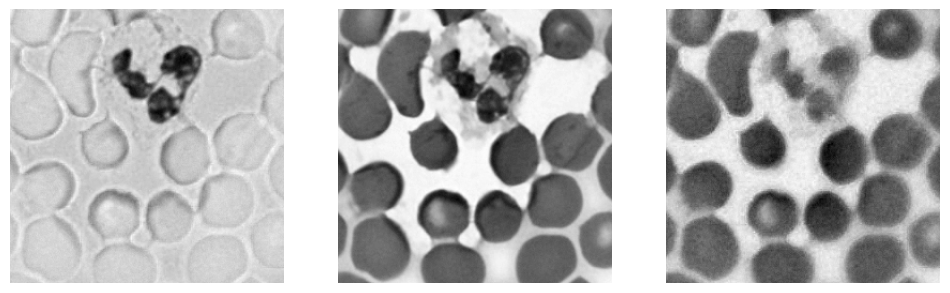

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# Visualize the patches
patches = img.squeeze(0).numpy()  # Convert tensor to numpy array
num_patches = patches.shape[0]

# Calculate the number of rows and columns for the subplot grid
num_rows = int(np.sqrt(num_patches))
num_cols = (num_patches // num_rows) + min(1, num_patches % num_rows)

# Create a subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 12))

# Flatten the axes array if it's a 1D array
axes = axes.flatten()

# Loop through patches and display them
for i in range(num_patches):
    # Check if the number of axes matches the number of patches
    if i >= len(axes):
        break

    # Display the patch without manual normalization
    axes[i].imshow(patches[i], cmap='gray')  # Use 'gray' colormap for grayscale images
    axes[i].axis('off')

# Hide any remaining empty subplots
for i in range(num_patches, len(axes)):
    axes[i].axis('off')

plt.show()

### Creating Patches

In [ ]:
pip install patchify

In [ ]:
import matplotlib.pyplot as plt

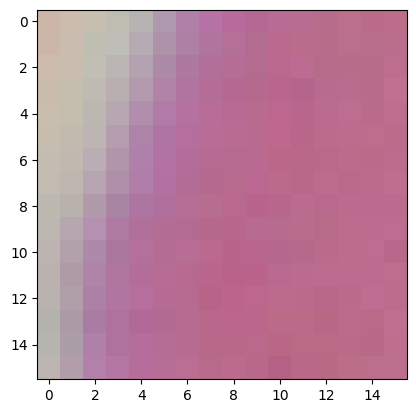

In [ ]:
# Import necessary libraries
from patchify import patchify
import numpy as np
from PIL import Image
from google.colab import drive



# Load the image
image_path = '/content/drive/MyDrive/100_images_dataset_malaria/image-1.png'  # replace with your image path
image = Image.open(image_path)
image = np.array(image)

# Define the patch size
patch_size = 16  # replace with your patch size

# Split the image into patches
patches = patchify(image, (patch_size, patch_size, 3), step=patch_size)

# Now 'patches' is a 4D array (grid_height, grid_width, patch_size, patch_size, 3)
# Get a specific patch
patch = patches[0, 0, :, :, :]

# Squeeze the patch to remove dimensions of size 1
patch = np.squeeze(patch)

# Now you can visualize the patch
plt.imshow(patch)
plt.show()


### Creating a graph with each of these patches as nodes

In [ ]:
# Import necessary libraries
from patchify import patchify
import numpy as np
from PIL import Image
from google.colab import drive
import networkx as nx
import matplotlib.pyplot as plt

In [ ]:
# Load the image
image_path = '/content/drive/MyDrive/100_images_dataset_malaria/image-1.png'  # replace with your image path
image = Image.open(image_path)
image = np.array(image)

In [ ]:
# Define the patch size
patch_size = 16  # replace with your patch size

In [ ]:
# Split the image into patches
patches = patchify(image, (patch_size, patch_size, 3), step=patch_size)

In [ ]:
# Now 'patches' is a 4D array (grid_height, grid_width, patch_size, patch_size, 3)
# Get a specific patch
patch = patches[1, 0, :, :, :]

In [ ]:
# Squeeze the patch to remove dimensions of size 1
patch = np.squeeze(patch)

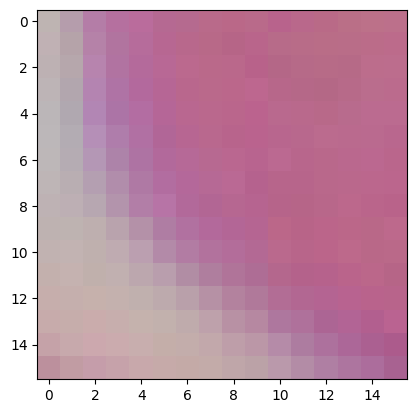

In [ ]:
# Now you can visualize the patch
plt.imshow(patch)
plt.show()

In [ ]:
# Create an empty graph
G = nx.Graph()

In [ ]:
# Add a node for each patch
for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        patch = patches[i, j, :, :, :]
        G.add_node((i, j), patch=patch)

In [ ]:
# Now each node in the graph represents a patch from the image
# You can access the patch for a node like this:
node = (0, 0)  # This represents the first patch
patch = G.nodes[node]['patch']

### Visualising the graph

Experimented with different types of Visualisation

In [ ]:
# Define the size of the grid
grid_size = int(np.sqrt(G.number_of_nodes()))

# Create a figure
fig, axs = plt.subplots(grid_size, grid_size, figsize=(10, 10))

# Loop over the nodes in the graph
for node, data in G.nodes(data=True):
    # Get the patch
    patch = data['patch']

    # Get the position of the node in the grid
    i, j = node

    # Display the patch in the corresponding subplot
    axs[i, j].imshow(patch)
    axs[i, j].axis('off')

# Show the plot
plt.show()

In [ ]:
print("Shape of patches:", patches.shape)

Shape of patches: (16, 16, 1, 16, 16, 3)


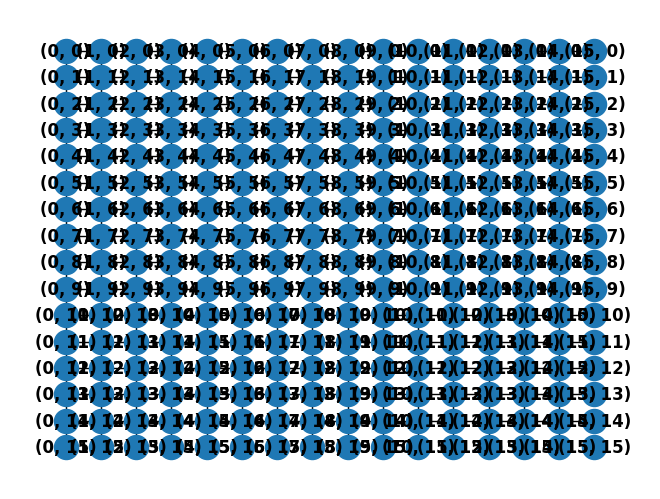

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, _, _, _ = patches.shape

# Create a graph
graph = nx.Graph()

# Add nodes to the graph
for i, j in product(range(grid_height), range(grid_width)):
    # Node attributes can be added based on patch properties
    graph.add_node((i, j), patch=patches[i, j])

# Add edges based on spatial proximity (e.g., connecting adjacent patches)
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    graph.add_edge((i, j), (i + 1, j))
    graph.add_edge((i, j), (i, j + 1))

# Visualize the graph (this is a basic visualization)
pos = {(i, j): (i, -j) for i, j in product(range(grid_height), range(grid_width))}
nx.draw(graph, pos, with_labels=True, font_weight='bold')
plt.show()


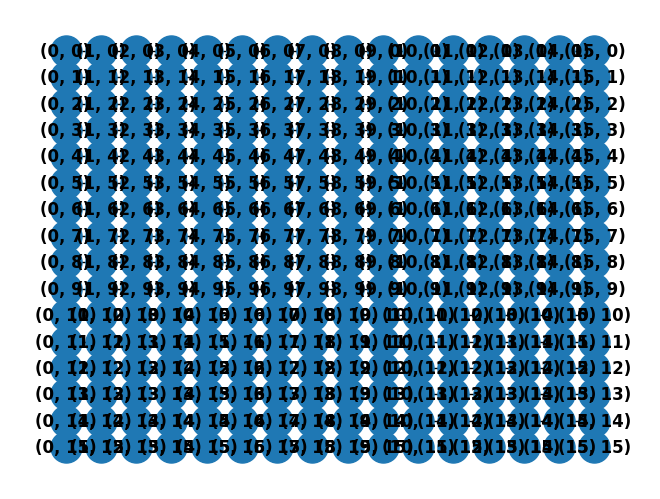

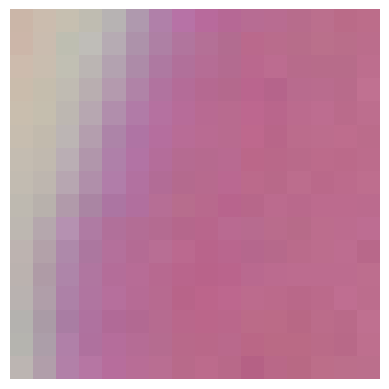

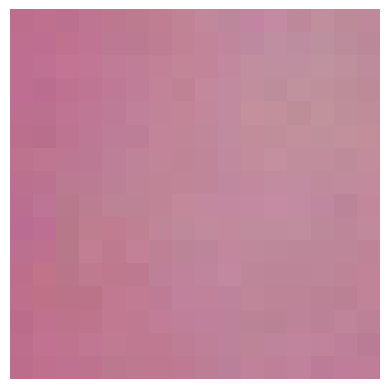

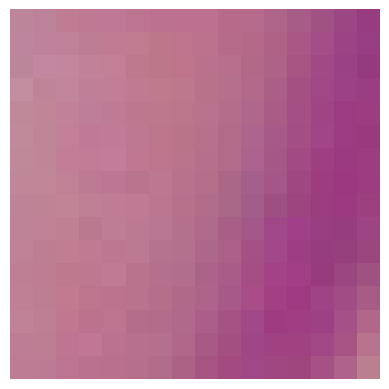

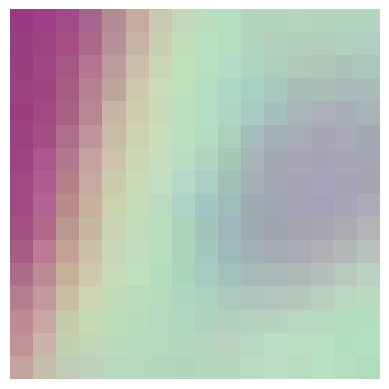

...

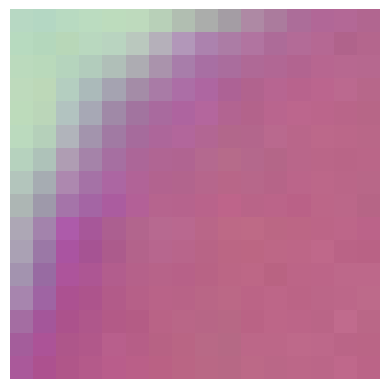

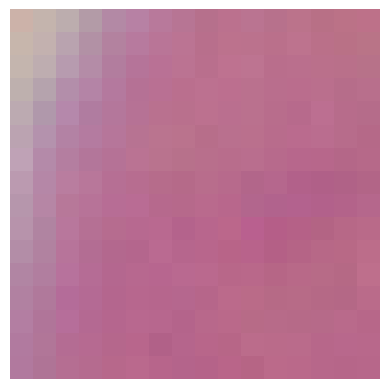

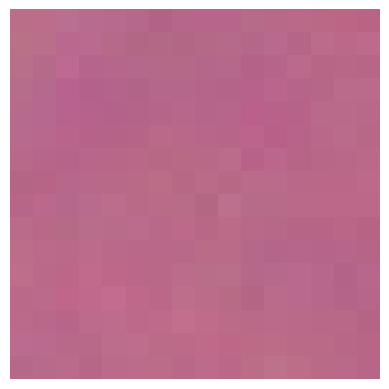

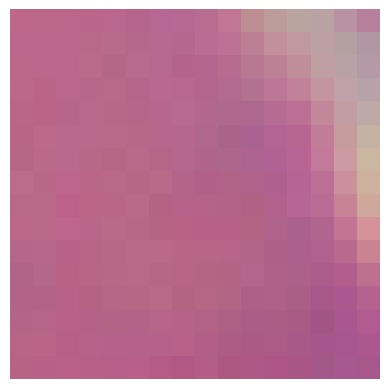

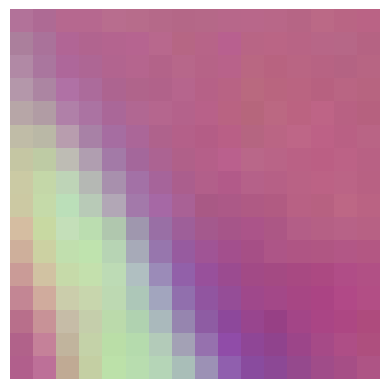

KeyboardInterrupt: ignored

<Figure size 640x480 with 0 Axes>

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, _, _, _ = patches.shape

# Create a graph
graph = nx.Graph()

# Add nodes to the graph with patch images as attributes
for i, j in product(range(grid_height), range(grid_width)):
    patch_image = patches[i, j, 0]
    graph.add_node((i, j), patch=patch_image)

# Add edges based on spatial proximity (e.g., connecting adjacent patches)
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    graph.add_edge((i, j), (i + 1, j))
    graph.add_edge((i, j), (i, j + 1))

# Visualize the graph with patch images
pos = {(i, j): (i, -j) for i, j in product(range(grid_height), range(grid_width))}
nx.draw(graph, pos, with_labels=True, font_weight='bold', node_size=500)

# Add patch images to the nodes
for node, (x, y) in pos.items():
    patch_image = graph.nodes[node]['patch']
    plt.figure()
    plt.imshow(patch_image)
    plt.axis('off')
    plt.show()


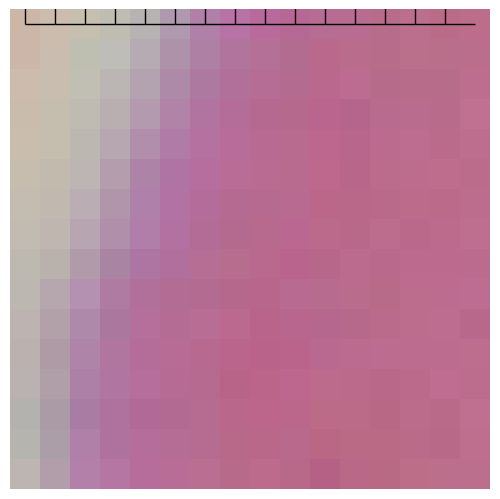

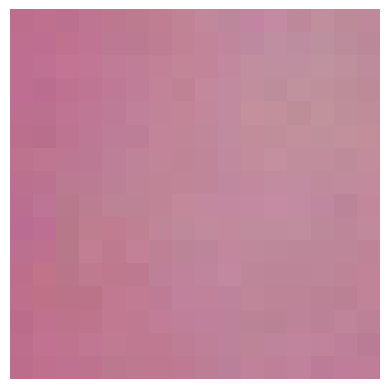

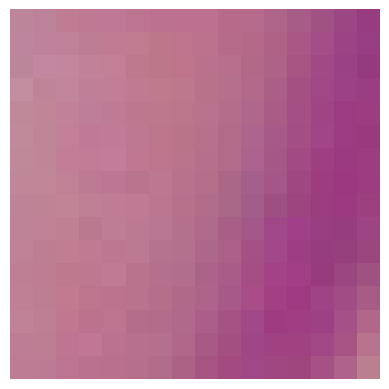

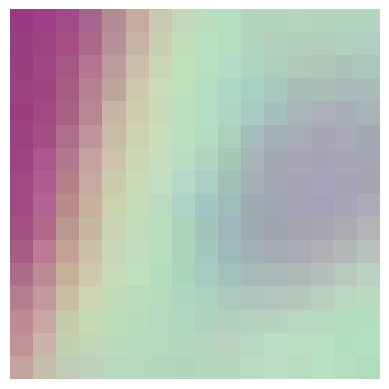

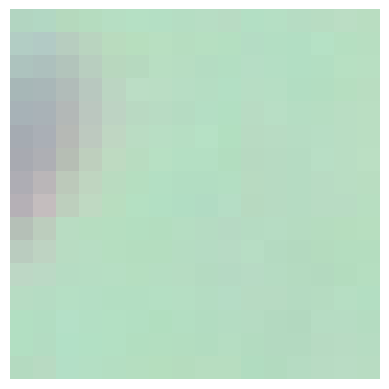

...

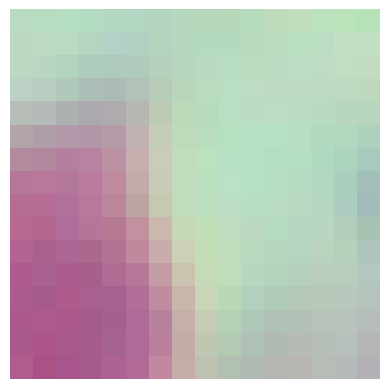

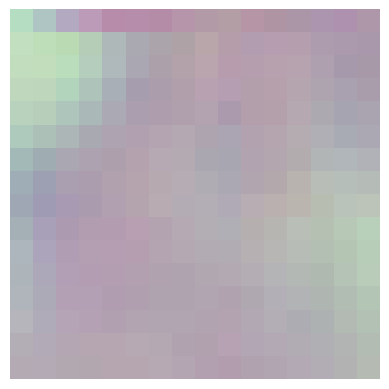

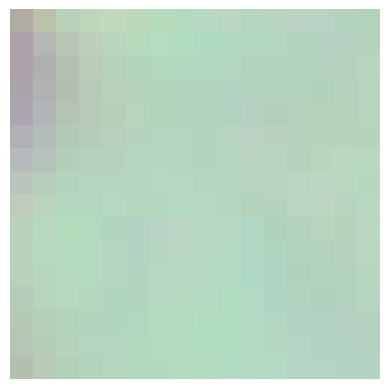

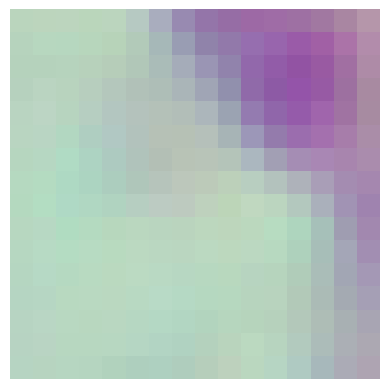

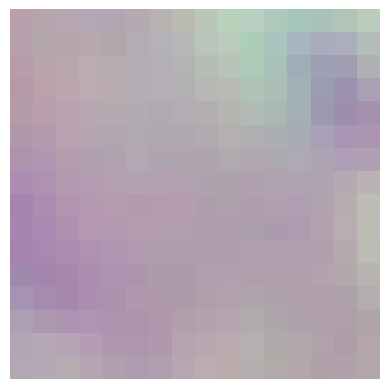

KeyboardInterrupt: ignored

<Figure size 640x480 with 0 Axes>

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, _, _, _ = patches.shape

# Create a graph
graph = nx.Graph()

# Add nodes to the graph with patch images as attributes
for i, j in product(range(grid_height), range(grid_width)):
    patch_image = patches[i, j, 0]
    graph.add_node((i, j), patch=patch_image)

# Add edges based on spatial proximity (e.g., connecting adjacent patches)
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    graph.add_edge((i, j), (i + 1, j))
    graph.add_edge((i, j), (i, j + 1))

# Visualize the graph with concise patch images on nodes
pos = {(i, j): (i, -j) for i, j in product(range(grid_height), range(grid_width))}
nx.draw(graph, pos, with_labels=False, font_weight='bold', node_size=500, node_color='none', edge_color='black')

# Add patch images to the nodes
for node, (x, y) in pos.items():
    patch_image = graph.nodes[node]['patch']
    plt.imshow(patch_image)
    plt.axis('off')
    plt.show()


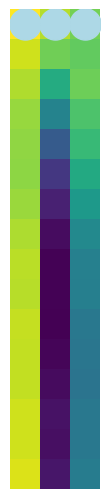

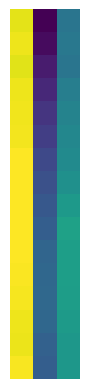

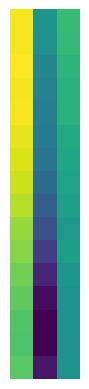

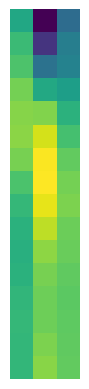

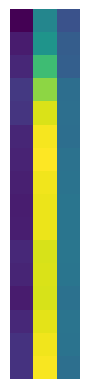

...

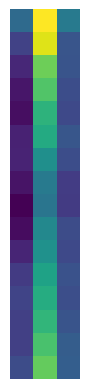

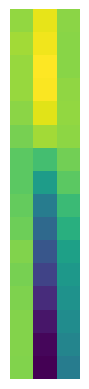

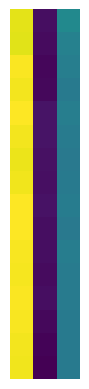

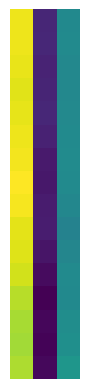

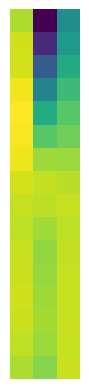

KeyboardInterrupt: ignored

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, patch_size, _, _ = patches.shape

# Create a graph
graph = nx.Graph()

# Add nodes to the graph with patch images as attributes
for i, j in product(range(grid_height), range(grid_width)):
    patch_image = patches[i, j, 0]
    graph.add_node((i, j), patch=patch_image)

# Add edges based on spatial proximity (e.g., connecting adjacent patches)
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    graph.add_edge((i, j), (i + 1, j))
    graph.add_edge((i, j), (i, j + 1))

# Visualize the graph with concise patch images on nodes
pos = {(i, j): (i, -j) for i, j in product(range(grid_height), range(grid_width))}
nx.draw(graph, pos, with_labels=False, font_weight='bold', node_size=500, node_color='lightblue', edge_color='black')

# Display a single representative image for each node
for node, (x, y) in pos.items():
    patch_image = graph.nodes[node]['patch']
    plt.imshow(np.mean(patch_image, axis=0))  # Display the mean color along channel axis
    plt.axis('off')
    plt.show()


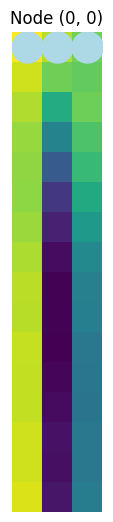

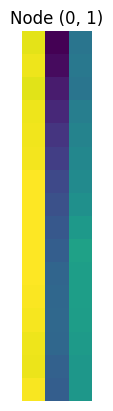

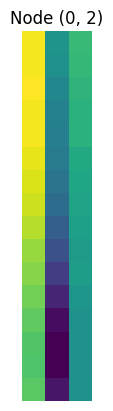

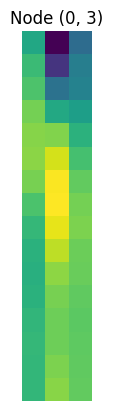

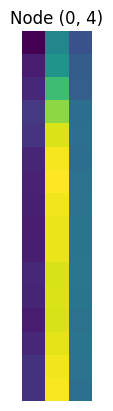

...

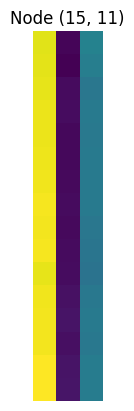

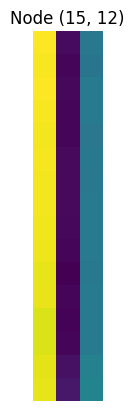

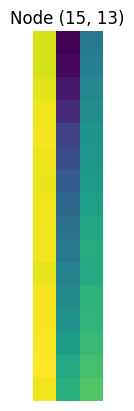

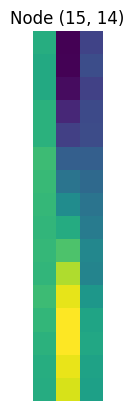

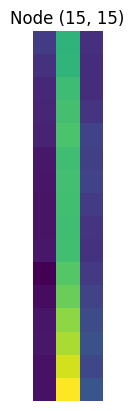

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, patch_size, _, _ = patches.shape

# Create a graph
graph = nx.Graph()

# Add nodes to the graph with patch images as attributes
for i, j in product(range(grid_height), range(grid_width)):
    patch_image = patches[i, j, 0]
    graph.add_node((i, j), patch=patch_image)

# Add edges based on spatial proximity (e.g., connecting adjacent patches)
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    graph.add_edge((i, j), (i + 1, j))
    graph.add_edge((i, j), (i, j + 1))

# Visualize the graph with concise patch images on nodes
pos = {(i, j): (i, -j) for i, j in product(range(grid_height), range(grid_width))}
nx.draw(graph, pos, with_labels=False, font_weight='bold', node_size=500, node_color='lightblue', edge_color='black')

# Display a single representative image for each node
for node, (x, y) in pos.items():
    patch_image = graph.nodes[node]['patch']
    plt.imshow(np.mean(patch_image, axis=0))  # Display the mean color along channel axis
    plt.title(f"Node {node}")
    plt.axis('off')
    plt.show()


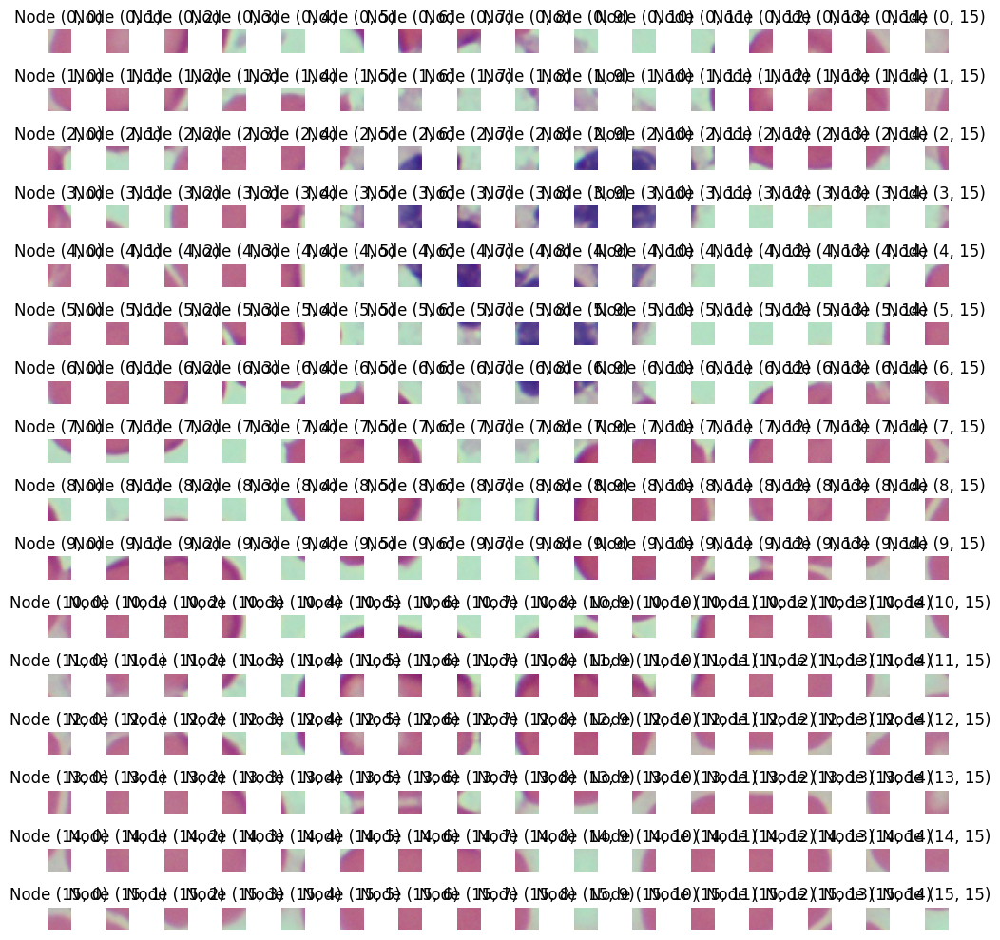

In [ ]:
import matplotlib.pyplot as plt
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, patch_size, _, _ = patches.shape

# Visualize the patches without graph edges
fig, axes = plt.subplots(grid_height, grid_width, figsize=(10, 10))

for (i, j), ax in zip(product(range(grid_height), range(grid_width)), axes.flatten()):
    patch_image = patches[i, j, 0]
    ax.imshow(patch_image)
    ax.axis('off')
    ax.set_title(f"Node ({i}, {j})")

plt.tight_layout()
plt.show()


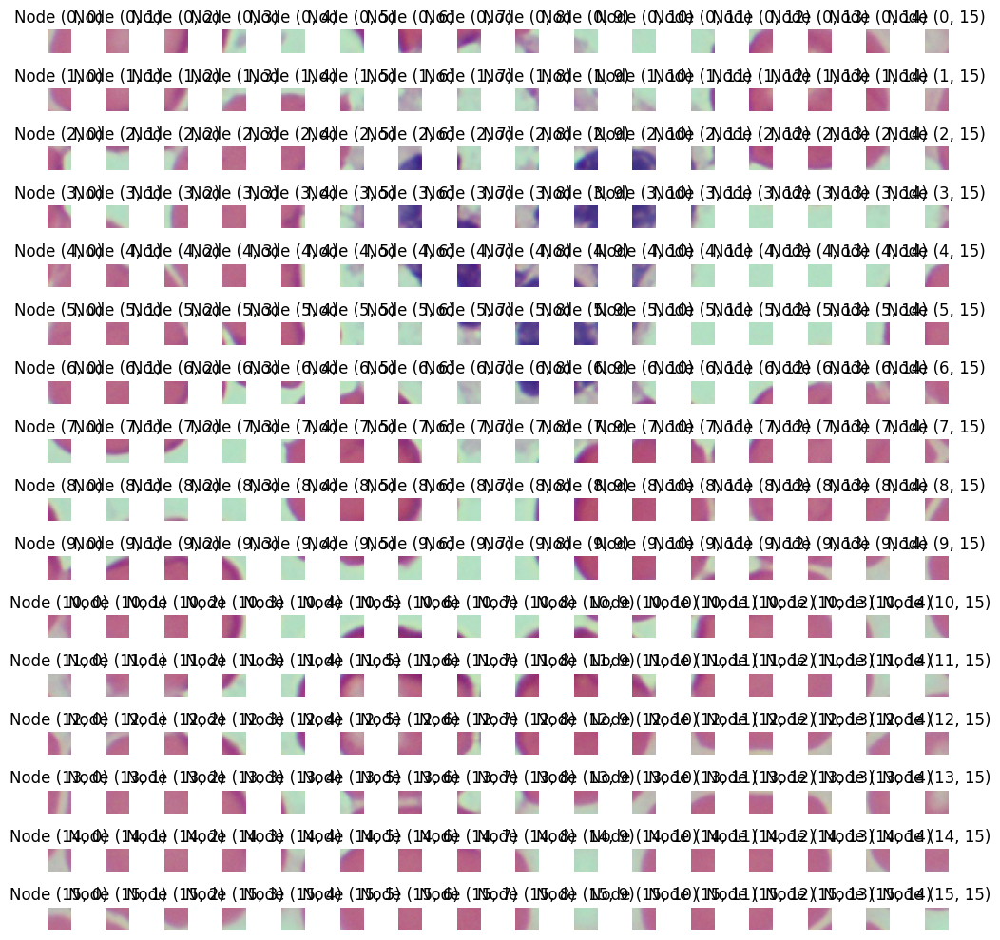

In [ ]:
import matplotlib.pyplot as plt
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, patch_size, _, _ = patches.shape

# Visualize the patches without graph edges
fig, axes = plt.subplots(grid_height, grid_width, figsize=(10, 10))

for (i, j), ax in zip(product(range(grid_height), range(grid_width)), axes.flatten()):
    patch_image = patches[i, j, 0]
    ax.imshow(patch_image)
    ax.axis('off')
    ax.set_title(f"Node ({i}, {j})")

plt.tight_layout()
plt.show()


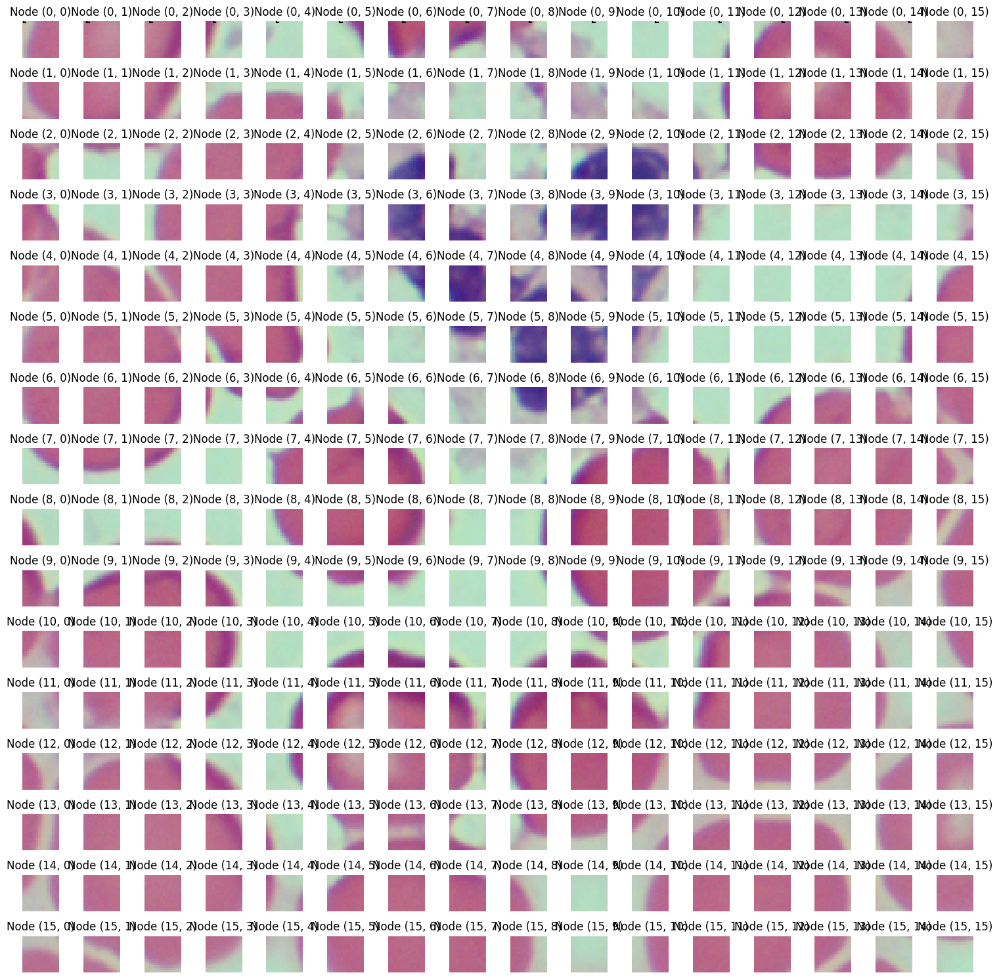

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, patch_size, _, _ = patches.shape

# Visualize the patches with node-to-node connections
fig, axes = plt.subplots(grid_height, grid_width, figsize=(15, 15))

# Draw the connections between nodes
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    axes[i, j].plot([j, j+1], [-i, -i], color='black')  # Connect horizontally
    axes[i, j].plot([j, j], [-i, -i-1], color='black')  # Connect vertically

# Display the patches at their respective nodes
for (i, j), ax in zip(product(range(grid_height), range(grid_width)), axes.flatten()):
    patch_image = patches[i, j, 0]
    ax.imshow(patch_image)
    ax.axis('off')
    ax.set_title(f"Node ({i}, {j})")

plt.tight_layout()
plt.show()


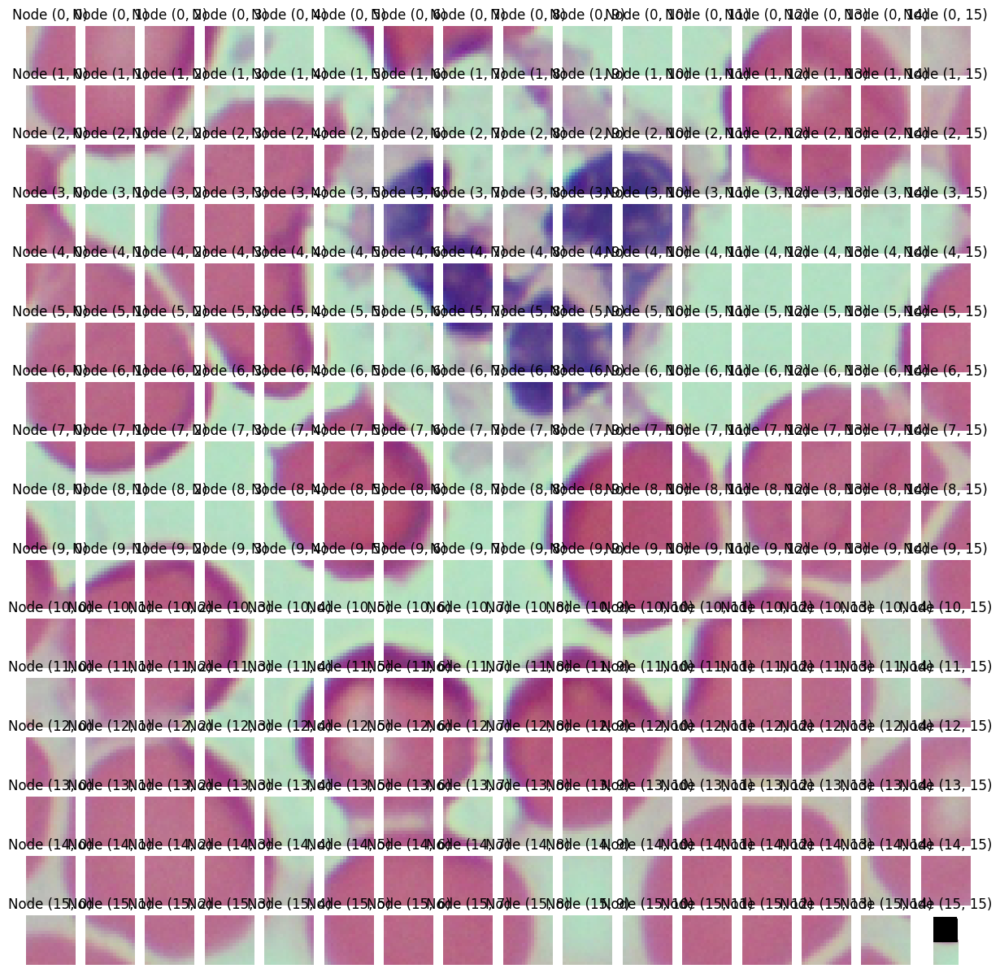

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, patch_size, _, _ = patches.shape

# Visualize the patches with node-to-node connections
fig, axes = plt.subplots(grid_height, grid_width, figsize=(15, 15))

# Display the patches at their respective nodes
for (i, j), ax in zip(product(range(grid_height), range(grid_width)), axes.flatten()):
    patch_image = patches[i, j, 0]
    ax.imshow(patch_image)
    ax.axis('off')
    ax.set_title(f"Node ({i}, {j})")

# Draw the connections between nodes
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    plt.plot([j, j+1], [-i, -i], color='black')  # Connect horizontally
    plt.plot([j, j], [-i, -i-1], color='black')  # Connect vertically

plt.show()


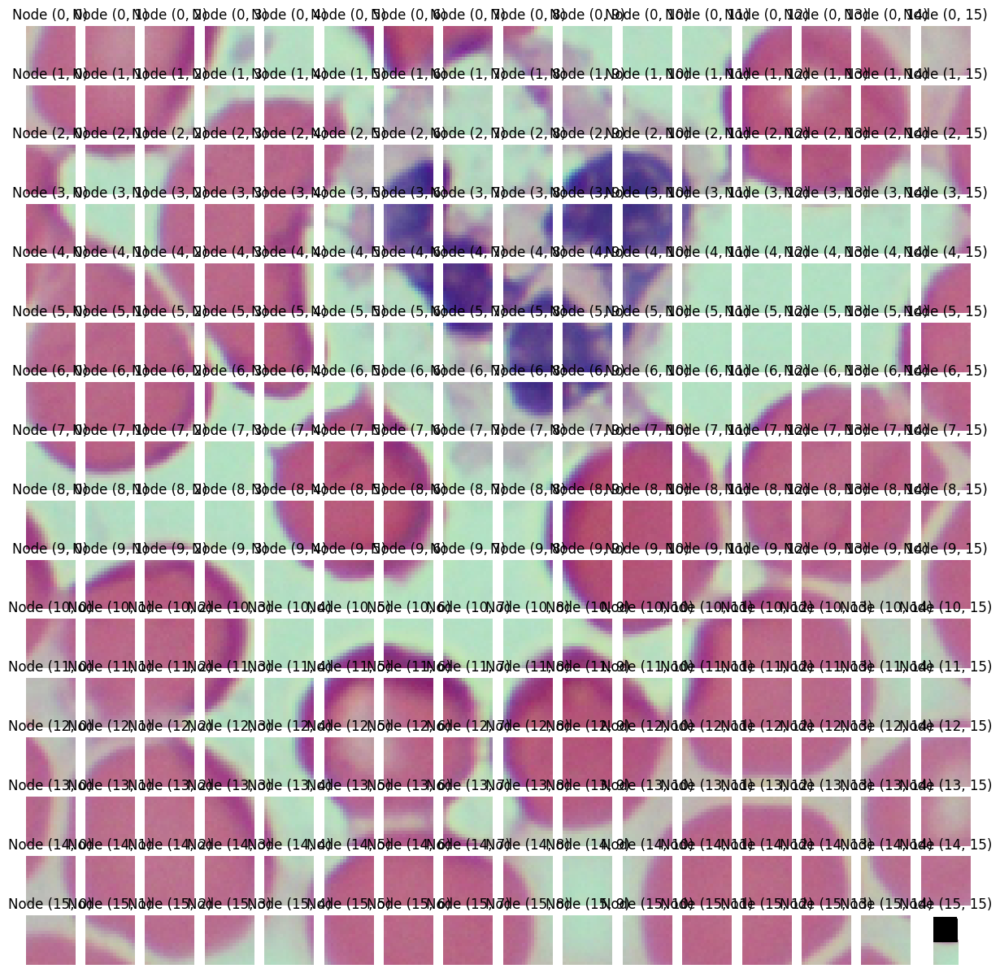

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

# Assuming you have 'patches' from the previous code
# 'patches' is a 4D array (grid_height, grid_width, 1, patch_size, patch_size, 3)

# Extracting dimensions
grid_height, grid_width, _, patch_size, _, _ = patches.shape

# Visualize the patches with node-to-node connections
fig, axes = plt.subplots(grid_height, grid_width, figsize=(15, 15))

# Display the patches at their respective nodes
for (i, j), ax in zip(product(range(grid_height), range(grid_width)), axes.flatten()):
    patch_image = patches[i, j, 0]
    ax.imshow(patch_image)
    ax.axis('off')
    ax.set_title(f"Node ({i}, {j})")

# Draw the connections between nodes
for i, j in product(range(grid_height - 1), range(grid_width - 1)):
    plt.plot([j, j+1], [-i, -i], color='black')  # Connect horizontally
    plt.plot([j, j], [-i, -i-1], color='black')  # Connect vertically

plt.show()


# Something totally different!

Preparing patches for input into the Vision GNN Model. This means we convert the patches into tensors and normalize them.

In [ ]:
import torch
from torchvision.transforms import functional as F

patches = torch.tensor(patches, dtype=torch.float32)

# Reshape the patches tensor to (number of patches, channels, height, width)
patches = patches.reshape(-1, patch_size, patch_size, 3)
patches = patches.permute(0, 3, 1, 2)  # move the channel dimension to the correct place

# Now normalize the patches
patches = F.normalize(patches, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

# # Convert the patches to tensors and normalize

# patches = patches.permute(0, 1, 4, 2, 3)  # move the channel dimension to the correct place
# patches = F.normalize(patches, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])


<ipython-input-27-58dce7a27e71>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  patches = torch.tensor(patches, dtype=torch.float32)


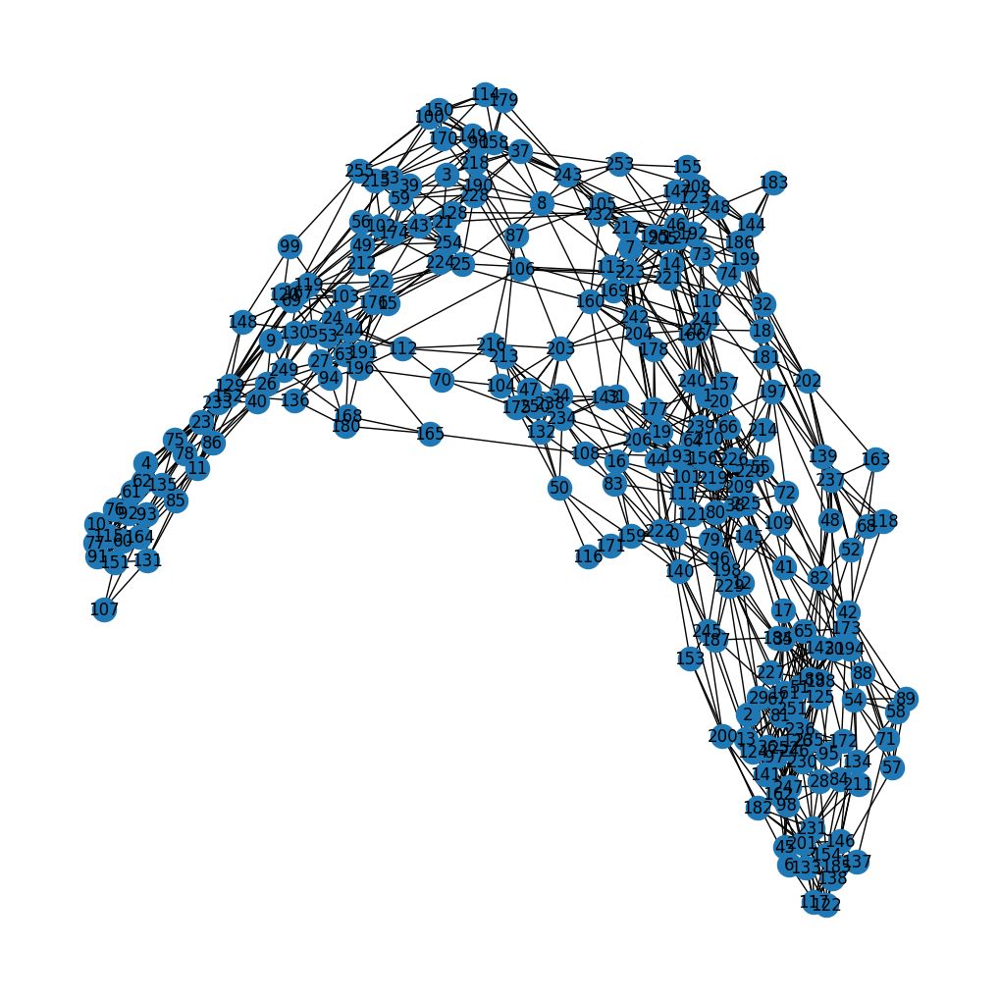

In [ ]:
import torch
from torchvision.transforms import functional as F
from sklearn.neighbors import NearestNeighbors
import networkx as nx
import matplotlib.pyplot as plt

# Assuming 'patches' and 'patch_size' are defined

# Convert patches to tensor and normalize
patches = torch.tensor(patches, dtype=torch.float32)
patches = patches.reshape(-1, patch_size, patch_size, 3)
patches = patches.permute(0, 3, 1, 2)  # move the channel dimension to the correct place
patches = F.normalize(patches, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

# Reshape the patches tensor to (number of patches, -1)
patches_reshaped = patches.reshape(patches.shape[0], -1)

# Convert the patches tensor to a numpy array
patches_np = patches_reshaped.cpu().numpy()

# Create a NearestNeighbors object
nbrs = NearestNeighbors(n_neighbors=9, algorithm='ball_tree').fit(patches_np)

# Find the K nearest neighbors for each patch
distances, indices = nbrs.kneighbors(patches_np)

# Initialize the adjacency matrix
adjacency_matrix = torch.zeros((patches.shape[0], patches.shape[0]))

# Fill the adjacency matrix
for i in range(patches.shape[0]):
    adjacency_matrix[i, indices[i]] = 1

# Create a graph
G = nx.Graph()

# Add edges to the graph
for i in range(adjacency_matrix.shape[0]):
    for j in range(i + 1, adjacency_matrix.shape[1]):
        if adjacency_matrix[i, j] == 1:
            G.add_edge(i, j)

plt.figure(figsize=(10, 10))

# Draw the graph
nx.draw(G, with_labels=True)
plt.show()


Vision GNN model expects the input to be in the form of a graph, where each node corresponds to a patch and the edges represent the relationships between the patches.

We first use `sklearn.neighbors` module to find the K-Nearest Neighbors for each patch.



In [ ]:
from sklearn.neighbors import NearestNeighbors

# Reshape the patches tensor to (number of patches, -1)
patches_reshaped = patches.reshape(patches.shape[0], -1)

# Convert the patches tensor to a numpy array
patches_np = patches_reshaped.cpu().numpy()

# Create a NearestNeighbors object
nbrs = NearestNeighbors(n_neighbors=9, algorithm='ball_tree').fit(patches_np)

# Find the K nearest neighbors for each patch
distances, indices = nbrs.kneighbors(patches_np)

In [ ]:
# Initialize the adjacency matrix
adjacency_matrix = torch.zeros((patches.shape[0], patches.shape[0]))

# Fill the adjacency matrix
for i in range(patches.shape[0]):
    adjacency_matrix[i, indices[i]] = 1

In [ ]:
!pip install networkx

In [ ]:
!pip install --upgrade networkx

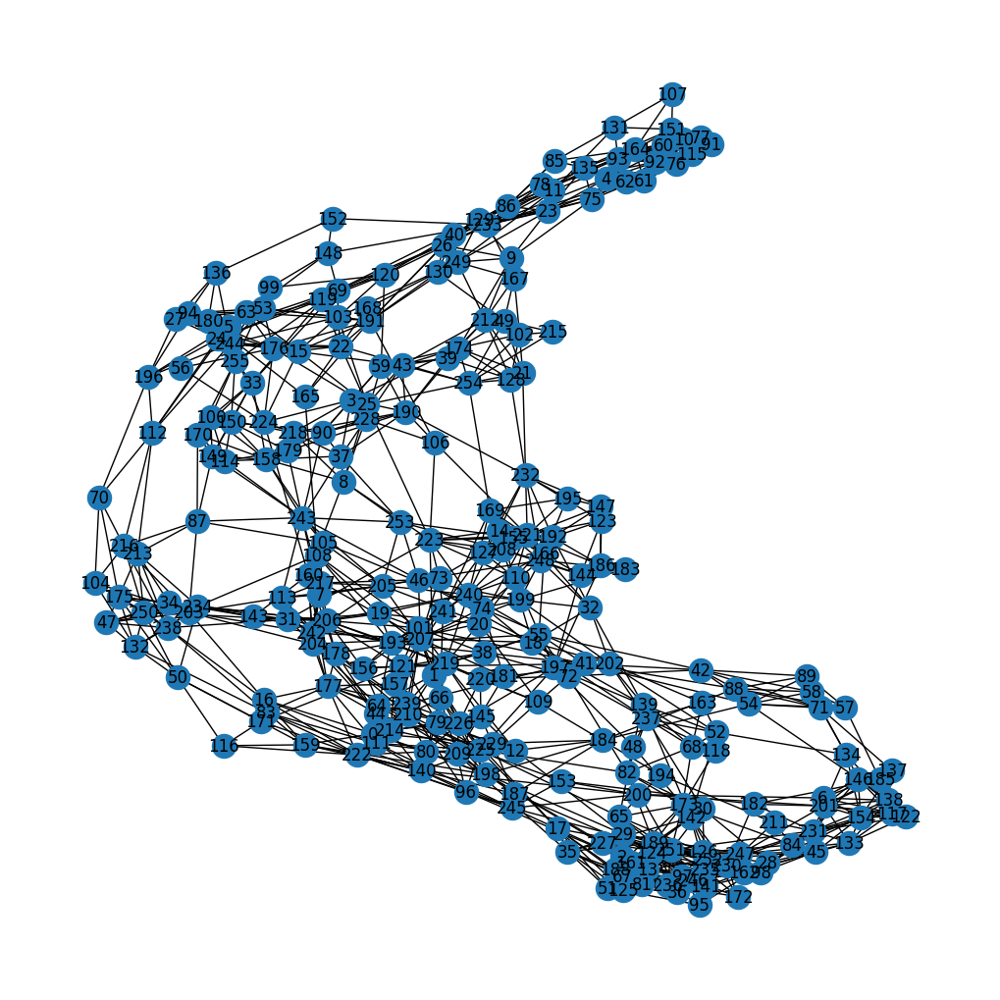

In [ ]:
# Create a graph
G = nx.Graph()

# Add edges to the graph
for i in range(adjacency_matrix.shape[0]):
    for j in range(i+1, adjacency_matrix.shape[1]):
        if adjacency_matrix[i, j] == 1:
            G.add_edge(i, j)


plt.figure(figsize=(10, 10))

# Draw the graph
nx.draw(G, with_labels=True)
plt.show()

In [ ]:
num_nodes = G.number_of_nodes()
print(f"The graph has {num_nodes} nodes.")

The graph has 256 nodes.


The above value is true, as we havean image to be of size 256x256, and each patch is of size 16x16.

Now we will try to represent the graph with the actual image patches as nodes

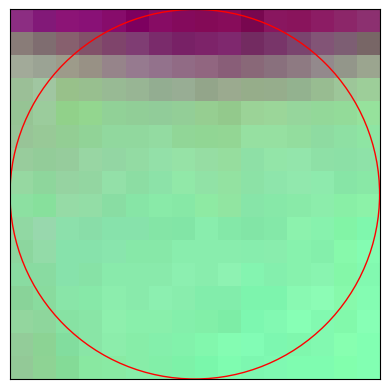

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpl_patches

# Rename your patches tensor to image_patches
image_patches = patches

fig, ax = plt.subplots()
nx.draw_networkx_edges(G, pos=nx.spring_layout(G), ax=ax)

# Draw the image patches at the node positions
for i in range(image_patches.shape[0]):
    img = image_patches[i].permute(1, 2, 0).cpu().numpy()
    img = (img - img.min()) / (img.max() - img.min())  # normalize to [0, 1]
    patch = mpl_patches.Circle((i, 0), radius=0.1, edgecolor='r', facecolor='none')
    ax.add_patch(patch)
    plt.imshow(img, extent=(i-0.1, i+0.1, -0.1, 0.1))

plt.show()


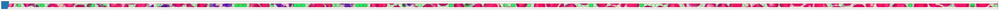

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpl_patches
import networkx as nx

# Rename your patches tensor to image_patches
image_patches = patches

# Create a figure with larger size
fig, ax = plt.subplots(figsize=(100, 100))  # Adjust the figure size as needed
pos = nx.spring_layout(G)  # positions for all nodes

# Draw the image patches at the node positions
for i in range(image_patches.shape[0]):
    img = image_patches[i].permute(1, 2, 0).cpu().numpy()
    img = (img - img.min()) / (img.max() - img.min())  # normalize to [0, 1]
    patch = mpl_patches.Circle((i, 0), radius=0.5, edgecolor='r', facecolor='none')  # Increase the radius as needed
    ax.add_patch(patch)
    plt.imshow(img, extent=(i-0.5, i+0.5, -0.5, 0.5))  # Adjust the extent as needed

# nodes
nx.draw_networkx_nodes(G, pos, node_size=2000)  # Increase the node size as needed

# edges
nx.draw_networkx_edges(G, pos, ax=ax)

plt.show()


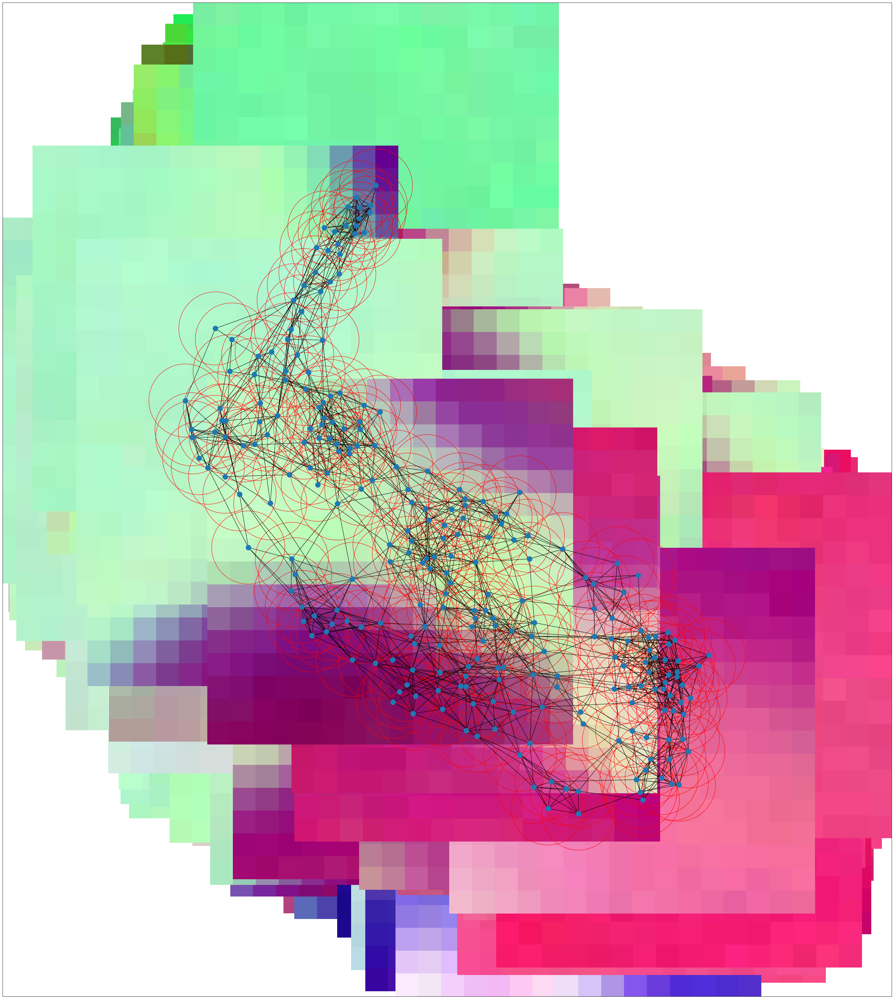

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpl_patches
import networkx as nx

# Rename your patches tensor to image_patches
image_patches = patches

fig, ax = plt.subplots(figsize=(50, 50))  # Adjust the figure size as needed
pos = nx.spring_layout(G)  # positions for all nodes

# Draw the image patches at the node positions
for node, (x, y) in pos.items():
    img = image_patches[node].permute(1, 2, 0).cpu().numpy()
    img = (img - img.min()) / (img.max() - img.min())  # normalize to [0, 1]
    patch = mpl_patches.Circle((x, y), radius=0.1, edgecolor='r', facecolor='none')  # Increase the radius as needed
    ax.add_patch(patch)
    plt.imshow(img, extent=(x-0.5, x+0.5, y-0.5, y+0.5))  # Adjust the extent as needed

# nodes
nx.draw_networkx_nodes(G, pos, node_size=200)  # Increase the node size as needed

# edges
nx.draw_networkx_edges(G, pos, ax=ax)

plt.show()


In [ ]:
from PIL import Image

# Load the image using PIL
image = Image.open('/content/drive/MyDrive/100_images_dataset_malaria/image-1.png')

# Ensure the image is an RGB image
if image.mode != 'RGB':
    image = image.convert('RGB')

# Now convert it to a tensor and normalize
image = F.to_tensor(image)
image = F.normalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])


In [ ]:
with torch.no_grad():
    prediction = model([image])


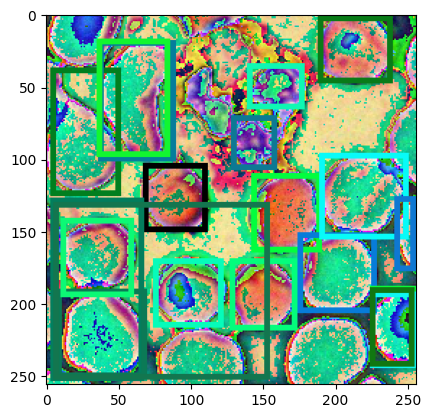

In [ ]:
# Convert the image tensor to uint8
image = image.mul(255).byte()

# Now draw the bounding boxes
image_with_boxes = draw_bounding_boxes(image, prediction[0]['boxes'], width=4)
plt.imshow(image_with_boxes.permute(1, 2, 0).numpy())
plt.show()
